In [178]:
# utility 
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import numpy as np
import matplotlib.pyplot as plt

from enum import Enum, auto

import torch
import torch.nn as nn
import torch.nn.functional as F


class NoiseType(Enum):
    DIAGONAL = auto()
    ISOTROPIC = auto()
    ISOTROPIC_ACROSS_CLUSTERS = auto()
    FIXED = auto()


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

# Define a decorator that randomly selects one of the multi-valued outputs
def rand_mod(y_func):
    def wrapper(x, *args, **kwargs):
        y_values = y_func(x, *args, **kwargs)
        y_rand = np.random.choice(y_values)
        return y_rand + 0.02 * np.random.randn(*y_rand.shape)
    return wrapper

Device: cpu


True


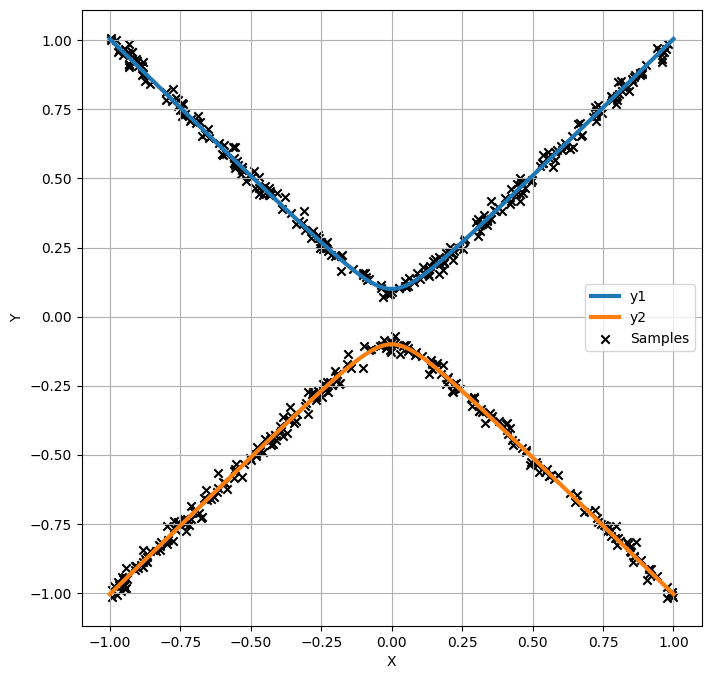

In [179]:
# Multi-valude function of x -> y1, y2, y3 ...
def y_circle(x, r = 1):
    y1 = np.sqrt(r - x**2)
    y2 = -np.sqrt(r - x**2)
    return y1, y2

def y_line(x, m = 1):
    return m * x, 0, -m * x

def y_hyperbola(x, a = 0.1, b = 1):
    y1 = np.sqrt(a**2 + b**2 * x**2)
    y2 = -np.sqrt(a**2 + b**2 * x**2)
    return y1, y2

def y_parabola(x, a = 1):
    return a * x**2, -a * x**2

y_multi = y_hyperbola

# Apply the rand_mod function to y_circle
y_multi_rand = rand_mod(y_multi)

# Create a dataset of (x, y) pairs
num_samples = 500
x = np.random.uniform(-1, 1, num_samples)
y = np.array([y_multi_rand(x_i) for x_i in x])

# # If we want not conflicting data
# num_samples = 500
# x = np.random.uniform(-1, 1, num_samples)
# y = np.array([y_multi(x_i)[0] for x_i in x])

print(x.shape == y.shape)

# Load dataset
batch_size = 32
x_tensor = torch.tensor(x, dtype=torch.float32).unsqueeze(1)
y_tensor = torch.tensor(y, dtype=torch.float32).unsqueeze(1)
dataset = TensorDataset(x_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

# Plot the function and the samples
x_vals = np.linspace(-1, 1, 100)
y_vals = [y_multi(x_i) for x_i in x_vals]
y_vals_transposed = list(zip(*y_vals))

# Data bounds for counter-sample generation
y_min = torch.tensor([-1])  # Joint y_target limits (radians)
y_max = torch.tensor([1])

plt.figure(figsize=(8, 8))
for i, y_val in enumerate(y_vals_transposed):
    plt.plot(x_vals, y_val, label=f'y{i+1}', linewidth=3)

# plt.hist2d(x, y, bins=50, cmap='viridis', alpha=0.5)
plt.scatter(x, y, marker='x', color='black', label='Samples')
plt.xlabel('X')
plt.ylabel('Y')
plt.grid()
plt.legend()

# Save the image
# plt.savefig('asset/proposal/hyperbola_data.png', dpi = 300)

plt.show()

In [180]:
# EBGAN: Energy-Based GAN
# Hyperparameters
input_size = 1  # x, y x_input
action_size = 1  # joint y_target
condition_size = 1
hidden_size = 64

# Hyperparameters
latent_size = 0
hidden_size = 64
output_size = 1
condition_size = 1
num_epochs = 100
batch_size = 32
learning_rate_d = 0.0002
learning_rate_g = 0.00005


num_epochs = 100
batch_size = 32

neg_count = 32
repeat_energy_updates = 1

learning_rate_e = 0.001
learning_rate_g = 0.0005


In [181]:
def evaluate_model(energy_model, generator, epoch, latent_size, device):
    # Generate grid points within the range of x values
    x_range = np.linspace(-1, 1, 100)
    y_range = np.linspace(-1, 1, 100)
    grid_x, grid_y = np.meshgrid(x_range, y_range)
    grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

    # Compute energy model output for each grid point
    energy_outputs = energy_model(grid_points[:, :1], grid_points[:, 1:]).detach().cpu().numpy()
    energy_outputs = energy_outputs.reshape(100, 100)

    # Normalize every column of the heatmap
    energy_outputs = (energy_outputs - energy_outputs.min(axis=0)) / (energy_outputs.max(axis=0) - energy_outputs.min(axis=0))

    # Plot the heatmap and the function, samples, and predictions in the same figure
    fig, ax = plt.subplots(figsize=(8, 8))

    # Plot the heatmap
    heatmap = ax.imshow(energy_outputs, extent=(-1, 1, -1, 1), origin='lower', cmap='coolwarm', alpha=0.5)

    # Plot the samples
    ax.scatter(x, y, marker='x', color='black', label='Samples')

    # Random sample the query points and get the predictions using mdn_generator
    num_query_points = 200
    query_points = np.linspace(-1, 1, num_query_points)
    query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
    z = torch.randn(num_query_points, latent_size).to(device)

    # Generate samples from the mixture model
    predictions_mdn = generator.sample(z, query_points_tensor).detach().cpu().numpy()

    # Plot the MDN generator predictions
    ax.scatter(query_points, predictions_mdn, marker='o', color='blue', label='MDN Generator Predictions', alpha=0.5)

    # Set limits to cut the plot within -1, 1
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.grid()
    ax.legend()
    plt.title(f"Evaluation at Epoch {epoch}")
    plt.show()

In [182]:
# Define Energy-based Model using MLP
class EnergyModel(nn.Module):
    def __init__(self, input_size, action_size, hidden_size):
        super(EnergyModel, self).__init__()
        self.energy_net = nn.Sequential(
            nn.Linear(input_size + action_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, 1)
        )

    def forward(self, x, y):
        combined = torch.cat([x, y], dim=-1)
        return self.energy_net(combined).squeeze(-1)

# Define MDN Generator
class MDNGenerator(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_gaussians, condition_size, noise_type=NoiseType.ISOTROPIC, fixed_noise_level=None):
        super(MDNGenerator, self).__init__()
        assert (fixed_noise_level is not None) == (noise_type is NoiseType.FIXED)
        self.latent_size = input_size
        self.num_gaussians = num_gaussians
        self.noise_type = noise_type
        self.fixed_noise_level = fixed_noise_level
        num_sigma_channels = {
            NoiseType.DIAGONAL: output_size * num_gaussians,
            NoiseType.ISOTROPIC: num_gaussians,
            NoiseType.ISOTROPIC_ACROSS_CLUSTERS: 1,
            NoiseType.FIXED: 0,
        }[noise_type]
        self.hidden = nn.Sequential(
            nn.Linear(input_size + condition_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU()
        )
        self.pi = nn.Linear(hidden_size, num_gaussians)
        self.normal_network = nn.Linear(hidden_size, output_size * num_gaussians + num_sigma_channels)

    def forward(self, x, condition, eps=1e-6):
        x = torch.cat([x, condition], dim=1)
        hidden = self.hidden(x)
        log_pi = torch.log_softmax(self.pi(hidden), dim=1)
        normal_params = self.normal_network(hidden)
        mu = normal_params[..., :self.num_gaussians * output_size]
        sigma = normal_params[..., self.num_gaussians * output_size:]
        if self.noise_type is NoiseType.DIAGONAL:
            sigma = torch.exp(sigma + eps)
        if self.noise_type is NoiseType.ISOTROPIC:
            sigma = torch.exp(sigma + eps).repeat(1, output_size)
        if self.noise_type is NoiseType.ISOTROPIC_ACROSS_CLUSTERS:
            sigma = torch.exp(sigma + eps).repeat(1, self.num_gaussians * output_size)
        if self.noise_type is NoiseType.FIXED:
            sigma = torch.full_like(mu, fill_value=self.fixed_noise_level)
        mu = mu.view(-1, self.num_gaussians, output_size)
        sigma = sigma.view(-1, self.num_gaussians, output_size)
        return log_pi, mu, sigma
    
    def sample(self, x, condition):
        log_pi, mu, sigma = self.forward(x, condition)
        cum_pi = torch.cumsum(torch.exp(log_pi), dim=-1)
        rvs = torch.rand(len(x), 1).to(x.device)
        rand_pi = torch.searchsorted(cum_pi, rvs)
        rand_normal = torch.randn_like(mu) * sigma + mu
        samples = torch.gather(rand_normal, 1, rand_pi.unsqueeze(-1).expand(-1, -1, mu.size(-1))).squeeze(1)
        return samples

def mdn_loss(log_pi, mu, sigma, y):
    z_score = (y.unsqueeze(1) - mu) / sigma
    normal_loglik = (
        -0.5 * torch.einsum("bij,bij->bi", z_score, z_score)
        - torch.sum(torch.log(sigma), dim=-1)
    )
    loglik = torch.logsumexp(log_pi + normal_loglik, dim=-1)
    return -loglik.mean()

# InfoNCE-style loss function
def info_nce_loss(energy_model, x, y, counter_samples):
    positive_energy = -energy_model(x, y)
    neg_energies = torch.stack([-energy_model(x, neg) for neg in counter_samples], dim=1)
    denominator = torch.logsumexp(torch.cat([positive_energy.unsqueeze(-1), neg_energies], dim=-1), dim=-1)
    return torch.mean(denominator - positive_energy)

# Counter-sample generation
def generate_counter_samples(y_min, y_max, batch_size, neg_count, device):
    counter_samples = [torch.rand((batch_size, y_min.size(-1)), device=device) * (y_max - y_min) + y_min for _ in range(neg_count)]
    return counter_samples

# Training loop combining energy model with MDN generator
def train_ebgan_mdn(energy_model, generator, dataloader, criterion, optimizer_e, optimizer_g, num_epochs, y_min, y_max, neg_count, device):
    energy_model.train()
    generator.train()
    # Initialize lists to track losses
    energy_losses = []
    generator_losses = []
    mdn_losses = []
    total_losses = []

    for epoch in range(num_epochs):
        epoch_energy_loss = 0.0
        epoch_generator_loss = 0.0
        epoch_mdn_loss = 0.0

        for batch_x, batch_y in dataloader:
            x_input = batch_x.to(device)
            y_target = batch_y.to(device)

            for _ in range(repeat_energy_updates):
                # Draw noise samples
                z = torch.randn(x_input.size(0), generator.latent_size).to(device)

                # Generate fake samples
                fake_y_target = generator.sample(z, x_input)

                counter_samples = generate_counter_samples(y_min, y_max, x_input.size(0), neg_count, device)

                # Append the fake samples to the counter samples
                counter_samples.append(fake_y_target)

                # Compute energy model loss
                loss = criterion(energy_model, x_input, y_target, counter_samples)

                # Backpropagation for energy model
                optimizer_e.zero_grad()
                loss.backward()
                optimizer_e.step()

                epoch_energy_loss += loss.item()

            # Update generator
            z = torch.randn(x_input.size(0), generator.latent_size).to(device)
            fake_y_target = generator.sample(z, x_input)

            # Compute energy-based generator loss
            g_loss = energy_model(x_input, fake_y_target).mean()

            # Compute MDN loss
            log_pi, mu, sigma = generator(z, x_input)
            mdn_g_loss = mdn_loss(log_pi, mu, sigma, y_target)

            # Log generator and MDN losses
            epoch_generator_loss += g_loss.item()
            epoch_mdn_loss += mdn_g_loss.item()

            # Combined loss
            combined_loss = g_loss + mdn_g_loss

            # Backpropagation for generator
            optimizer_g.zero_grad()
            combined_loss.backward()
            optimizer_g.step()

        # Average losses per epoch
        avg_energy_loss = epoch_energy_loss / (len(dataloader) * repeat_energy_updates)
        avg_generator_loss = epoch_generator_loss / len(dataloader)
        avg_mdn_loss = epoch_mdn_loss / len(dataloader)
        total_loss = avg_generator_loss + avg_mdn_loss

        # Store losses for plotting
        energy_losses.append(avg_energy_loss)
        generator_losses.append(avg_generator_loss)
        mdn_losses.append(avg_mdn_loss)
        total_losses.append(total_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}], EM Loss: {avg_energy_loss:.4f}, Gen-Energy Loss: {avg_generator_loss:.4f}, MDN Loss: {avg_mdn_loss:.4f}, Total Gen Loss: {total_loss:.4f}")

        # Evaluate model every 20 epochs
        if (epoch + 1) % 5 == 0:
            evaluate_model(energy_model, generator, epoch + 1, latent_size, device)
        
    # Plot the loss curves
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), energy_losses, label='Energy Model Loss')
    plt.plot(range(1, num_epochs + 1), generator_losses, label='Generator Energy Loss')
    plt.plot(range(1, num_epochs + 1), mdn_losses, label='MDN Loss')
    plt.plot(range(1, num_epochs + 1), total_losses, label='Total Generator Loss', linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves for EBGAN-MDN Training')
    plt.legend()
    plt.grid(True)
    plt.show()


Epoch [1/100], EM Loss: 3.5197, Gen-Energy Loss: -0.0191, MDN Loss: 0.1330, Total Gen Loss: 0.1139
Epoch [2/100], EM Loss: 3.5037, Gen-Energy Loss: 0.0239, MDN Loss: 0.0422, Total Gen Loss: 0.0661
Epoch [3/100], EM Loss: 3.4726, Gen-Energy Loss: 0.0732, MDN Loss: -0.0085, Total Gen Loss: 0.0647
Epoch [4/100], EM Loss: 3.4127, Gen-Energy Loss: 0.1661, MDN Loss: -0.0289, Total Gen Loss: 0.1372
Epoch [5/100], EM Loss: 3.2970, Gen-Energy Loss: 0.2780, MDN Loss: -0.0525, Total Gen Loss: 0.2255


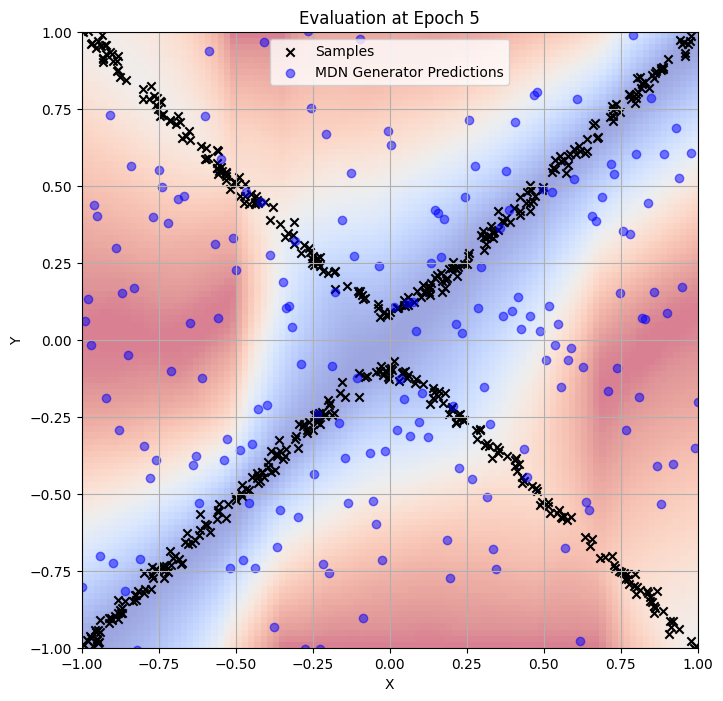

Epoch [6/100], EM Loss: 3.1271, Gen-Energy Loss: 0.4752, MDN Loss: -0.0844, Total Gen Loss: 0.3909
Epoch [7/100], EM Loss: 2.9277, Gen-Energy Loss: 0.6827, MDN Loss: -0.2171, Total Gen Loss: 0.4656
Epoch [8/100], EM Loss: 2.7278, Gen-Energy Loss: 0.6776, MDN Loss: -0.4542, Total Gen Loss: 0.2233
Epoch [9/100], EM Loss: 2.5649, Gen-Energy Loss: 0.7474, MDN Loss: -0.8296, Total Gen Loss: -0.0822
Epoch [10/100], EM Loss: 2.4576, Gen-Energy Loss: 0.7296, MDN Loss: -1.1188, Total Gen Loss: -0.3892


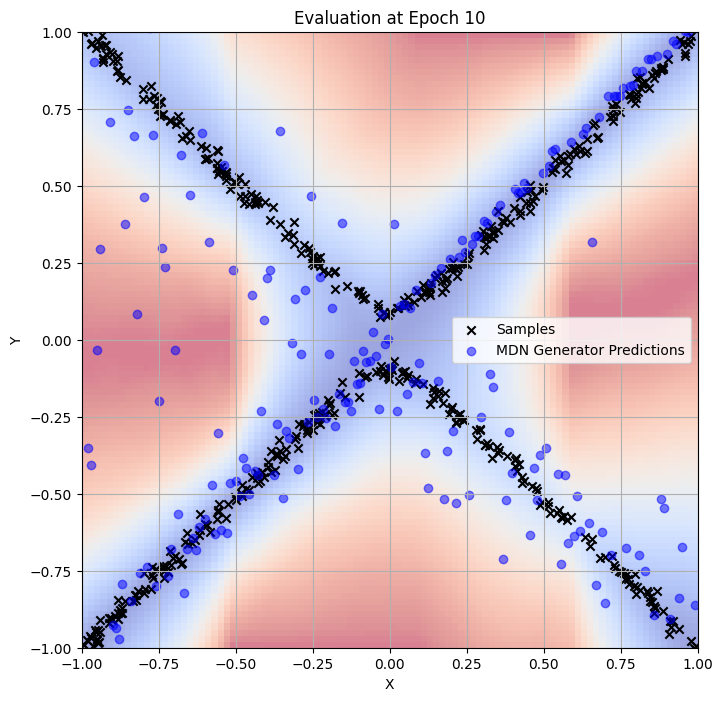

Epoch [11/100], EM Loss: 2.3702, Gen-Energy Loss: 0.7137, MDN Loss: -1.2439, Total Gen Loss: -0.5302
Epoch [12/100], EM Loss: 2.2712, Gen-Energy Loss: 0.8409, MDN Loss: -1.6844, Total Gen Loss: -0.8434
Epoch [13/100], EM Loss: 2.2409, Gen-Energy Loss: 0.4341, MDN Loss: -1.9693, Total Gen Loss: -1.5352
Epoch [14/100], EM Loss: 2.1819, Gen-Energy Loss: 0.6413, MDN Loss: -1.9609, Total Gen Loss: -1.3196
Epoch [15/100], EM Loss: 2.1101, Gen-Energy Loss: 0.7582, MDN Loss: -2.1411, Total Gen Loss: -1.3829


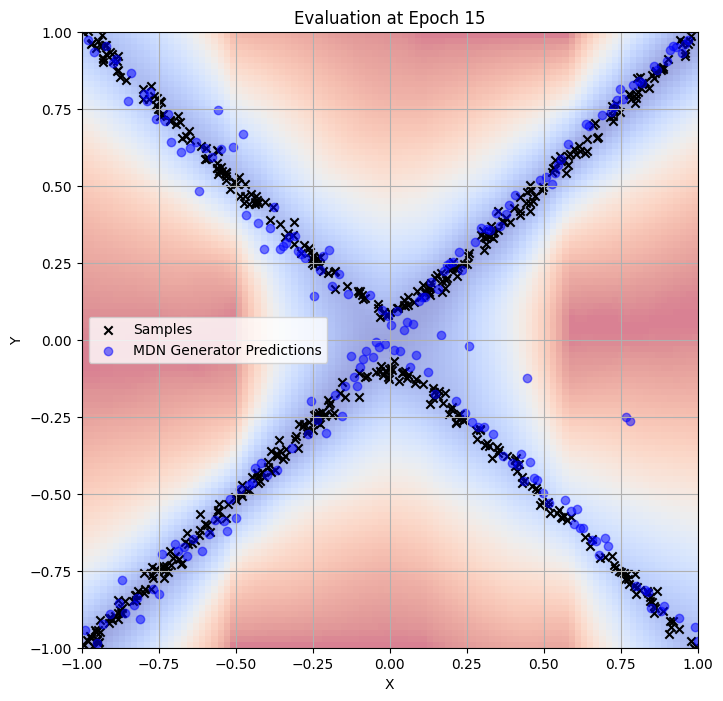

Epoch [16/100], EM Loss: 2.0905, Gen-Energy Loss: 0.6871, MDN Loss: -2.2927, Total Gen Loss: -1.6056
Epoch [17/100], EM Loss: 2.0380, Gen-Energy Loss: 0.7419, MDN Loss: -2.2780, Total Gen Loss: -1.5361
Epoch [18/100], EM Loss: 2.0072, Gen-Energy Loss: 0.7611, MDN Loss: -2.3280, Total Gen Loss: -1.5669
Epoch [19/100], EM Loss: 1.9846, Gen-Energy Loss: 0.7140, MDN Loss: -2.3857, Total Gen Loss: -1.6717
Epoch [20/100], EM Loss: 1.9437, Gen-Energy Loss: 0.7478, MDN Loss: -2.3790, Total Gen Loss: -1.6312


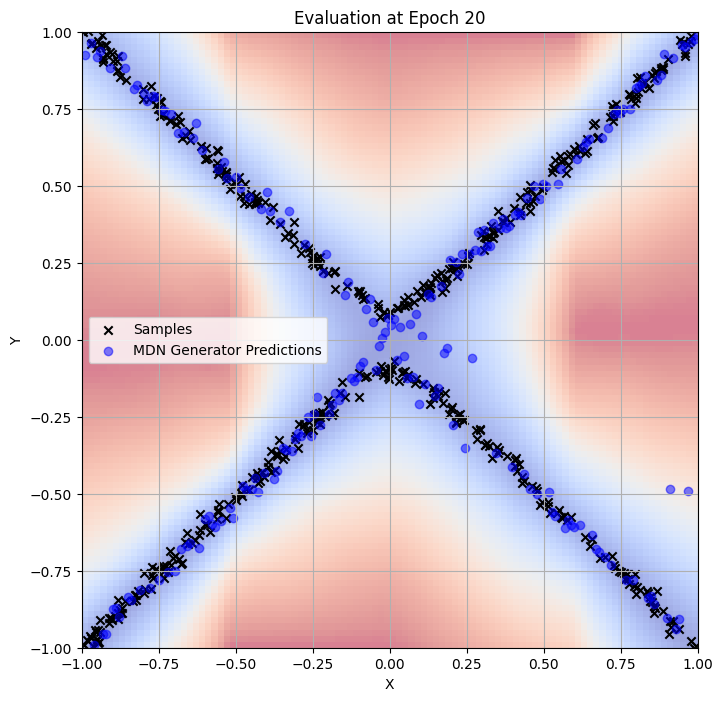

Epoch [21/100], EM Loss: 1.9099, Gen-Energy Loss: 0.8209, MDN Loss: -2.4195, Total Gen Loss: -1.5986
Epoch [22/100], EM Loss: 1.9158, Gen-Energy Loss: 0.9008, MDN Loss: -2.4129, Total Gen Loss: -1.5122
Epoch [23/100], EM Loss: 1.9250, Gen-Energy Loss: 1.0664, MDN Loss: -2.3340, Total Gen Loss: -1.2675
Epoch [24/100], EM Loss: 1.8920, Gen-Energy Loss: 1.2146, MDN Loss: -2.2773, Total Gen Loss: -1.0628
Epoch [25/100], EM Loss: 1.8207, Gen-Energy Loss: 1.2808, MDN Loss: -2.2770, Total Gen Loss: -0.9962


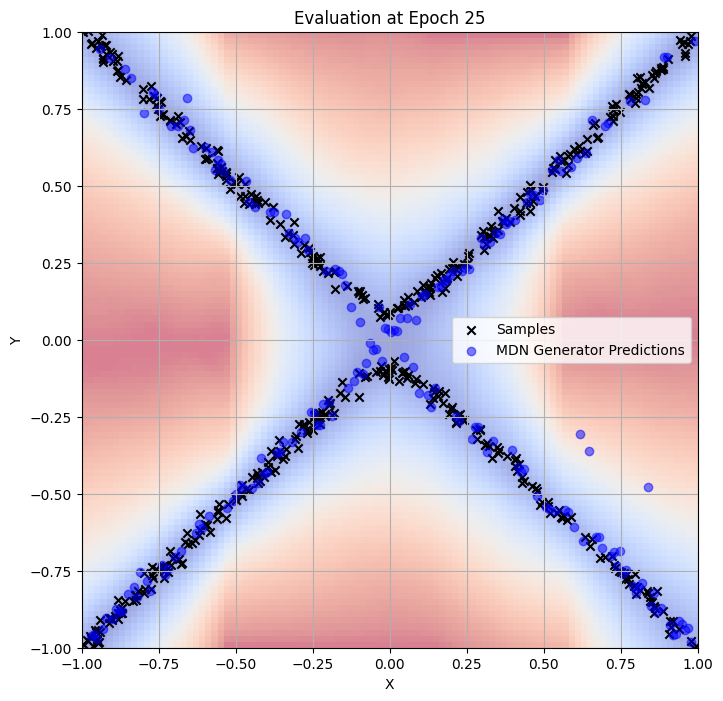

Epoch [26/100], EM Loss: 1.8228, Gen-Energy Loss: 1.3372, MDN Loss: -2.4394, Total Gen Loss: -1.1022
Epoch [27/100], EM Loss: 1.8326, Gen-Energy Loss: 1.4480, MDN Loss: -2.3703, Total Gen Loss: -0.9223
Epoch [28/100], EM Loss: 1.7883, Gen-Energy Loss: 1.4061, MDN Loss: -2.4260, Total Gen Loss: -1.0199
Epoch [29/100], EM Loss: 1.8183, Gen-Energy Loss: 1.4502, MDN Loss: -2.3294, Total Gen Loss: -0.8792
Epoch [30/100], EM Loss: 1.8088, Gen-Energy Loss: 1.5577, MDN Loss: -2.4338, Total Gen Loss: -0.8761


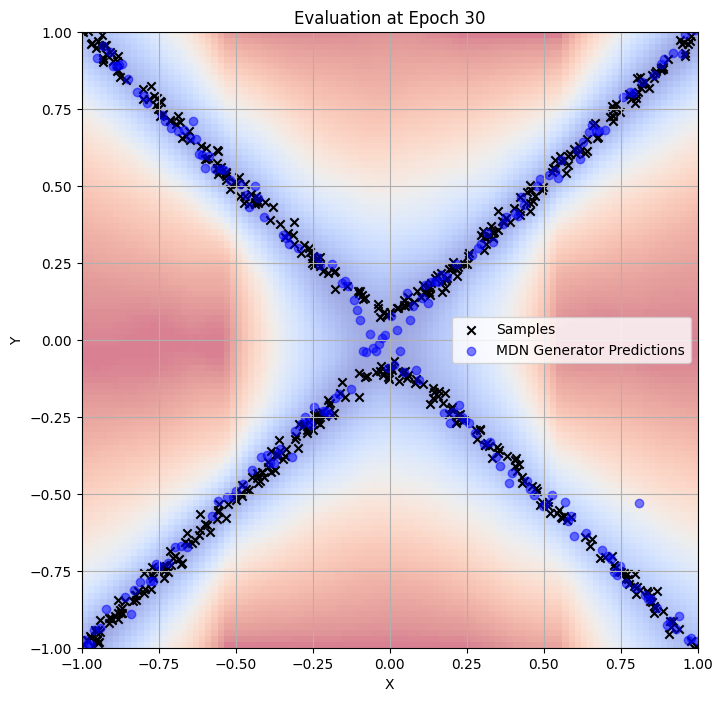

Epoch [31/100], EM Loss: 1.7887, Gen-Energy Loss: 1.6422, MDN Loss: -2.3932, Total Gen Loss: -0.7510
Epoch [32/100], EM Loss: 1.8016, Gen-Energy Loss: 1.6128, MDN Loss: -2.4037, Total Gen Loss: -0.7909
Epoch [33/100], EM Loss: 1.7942, Gen-Energy Loss: 1.6928, MDN Loss: -2.3377, Total Gen Loss: -0.6449
Epoch [34/100], EM Loss: 1.8454, Gen-Energy Loss: 1.5537, MDN Loss: -2.4275, Total Gen Loss: -0.8738
Epoch [35/100], EM Loss: 1.7847, Gen-Energy Loss: 1.8598, MDN Loss: -2.3777, Total Gen Loss: -0.5179


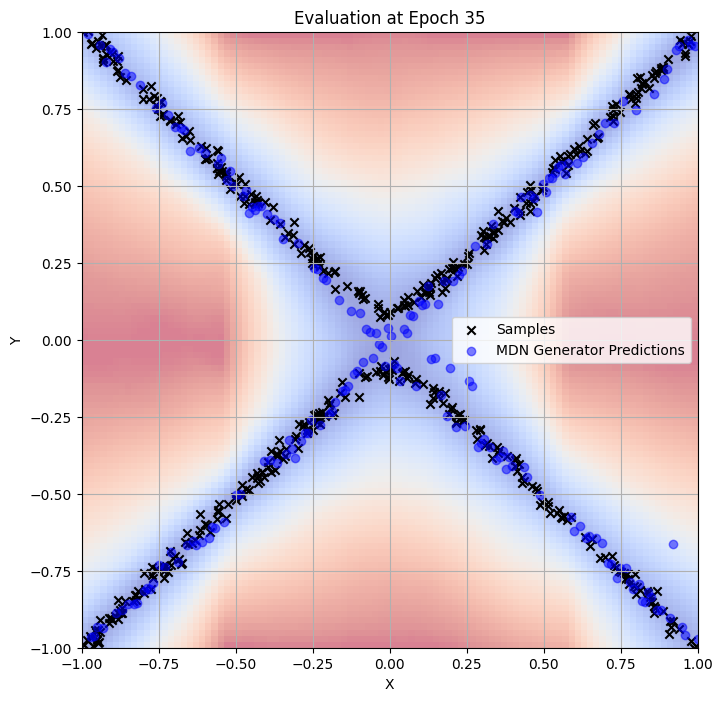

Epoch [36/100], EM Loss: 1.8201, Gen-Energy Loss: 1.9319, MDN Loss: -2.4077, Total Gen Loss: -0.4758
Epoch [37/100], EM Loss: 1.7804, Gen-Energy Loss: 1.8223, MDN Loss: -2.3633, Total Gen Loss: -0.5410
Epoch [38/100], EM Loss: 1.8027, Gen-Energy Loss: 2.1605, MDN Loss: -2.3760, Total Gen Loss: -0.2156
Epoch [39/100], EM Loss: 1.7877, Gen-Energy Loss: 1.8482, MDN Loss: -2.4283, Total Gen Loss: -0.5801
Epoch [40/100], EM Loss: 1.7153, Gen-Energy Loss: 2.3692, MDN Loss: -2.4106, Total Gen Loss: -0.0414


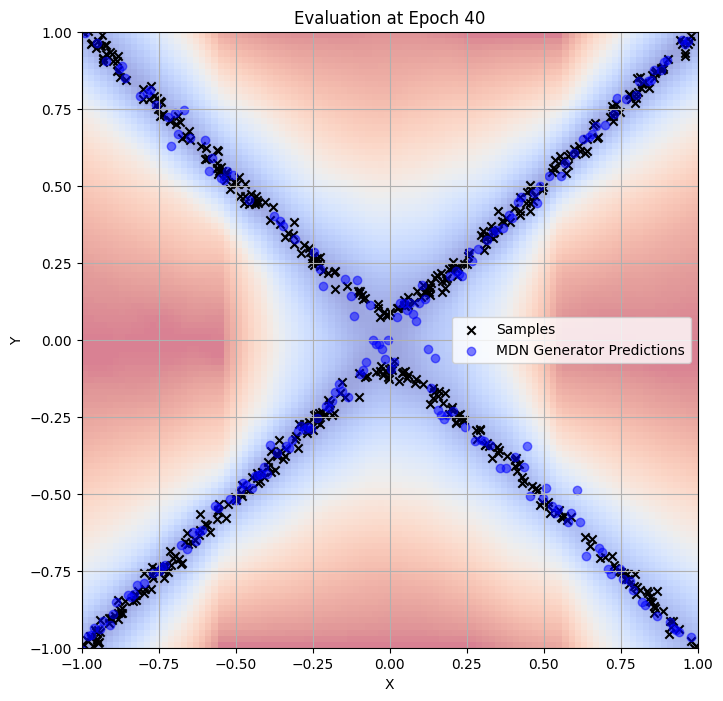

Epoch [41/100], EM Loss: 1.7358, Gen-Energy Loss: 2.4516, MDN Loss: -2.4306, Total Gen Loss: 0.0211
Epoch [42/100], EM Loss: 1.7173, Gen-Energy Loss: 2.2815, MDN Loss: -2.4373, Total Gen Loss: -0.1558
Epoch [43/100], EM Loss: 1.6384, Gen-Energy Loss: 2.3874, MDN Loss: -2.4314, Total Gen Loss: -0.0440
Epoch [44/100], EM Loss: 1.7078, Gen-Energy Loss: 2.5161, MDN Loss: -2.4338, Total Gen Loss: 0.0823
Epoch [45/100], EM Loss: 1.6803, Gen-Energy Loss: 2.3422, MDN Loss: -2.4497, Total Gen Loss: -0.1075


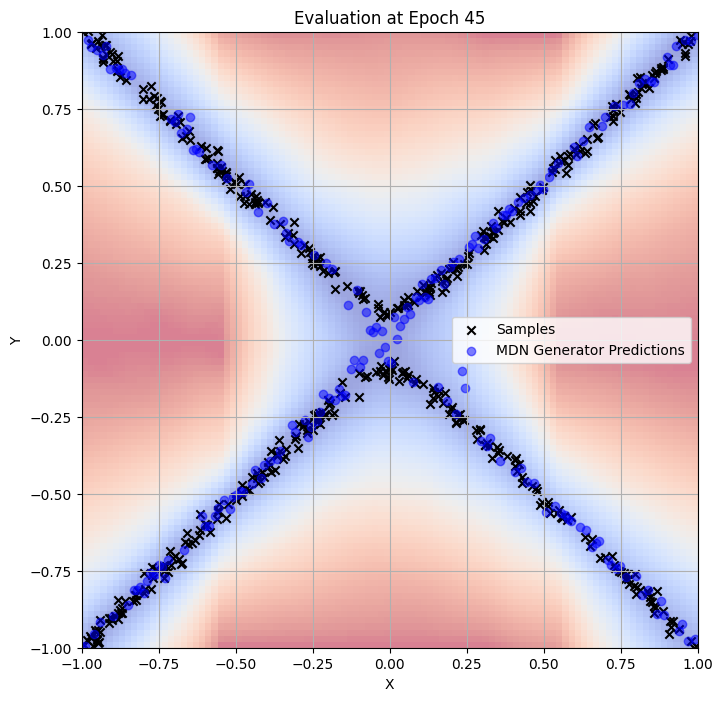

Epoch [46/100], EM Loss: 1.7060, Gen-Energy Loss: 2.5024, MDN Loss: -2.4292, Total Gen Loss: 0.0733
Epoch [47/100], EM Loss: 1.6795, Gen-Energy Loss: 2.5796, MDN Loss: -2.4333, Total Gen Loss: 0.1462
Epoch [48/100], EM Loss: 1.6960, Gen-Energy Loss: 2.6364, MDN Loss: -2.4887, Total Gen Loss: 0.1478
Epoch [49/100], EM Loss: 1.7169, Gen-Energy Loss: 2.6596, MDN Loss: -2.4257, Total Gen Loss: 0.2339
Epoch [50/100], EM Loss: 1.6431, Gen-Energy Loss: 2.8292, MDN Loss: -2.3590, Total Gen Loss: 0.4702


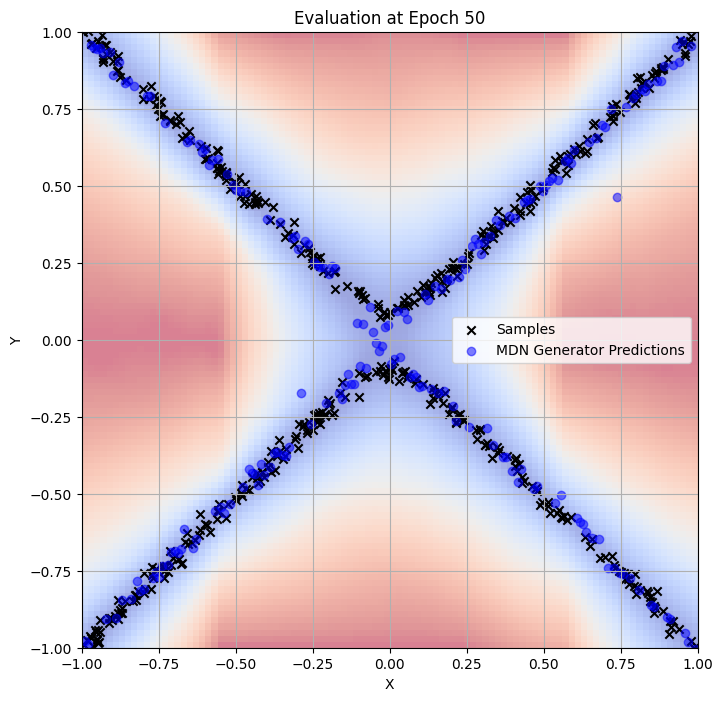

Epoch [51/100], EM Loss: 1.6880, Gen-Energy Loss: 2.8818, MDN Loss: -2.4580, Total Gen Loss: 0.4239
Epoch [52/100], EM Loss: 1.7234, Gen-Energy Loss: 2.6855, MDN Loss: -2.3940, Total Gen Loss: 0.2915
Epoch [53/100], EM Loss: 1.7100, Gen-Energy Loss: 2.6929, MDN Loss: -2.4463, Total Gen Loss: 0.2466
Epoch [54/100], EM Loss: 1.7362, Gen-Energy Loss: 2.8451, MDN Loss: -2.4649, Total Gen Loss: 0.3803
Epoch [55/100], EM Loss: 1.6651, Gen-Energy Loss: 2.8438, MDN Loss: -2.3969, Total Gen Loss: 0.4470


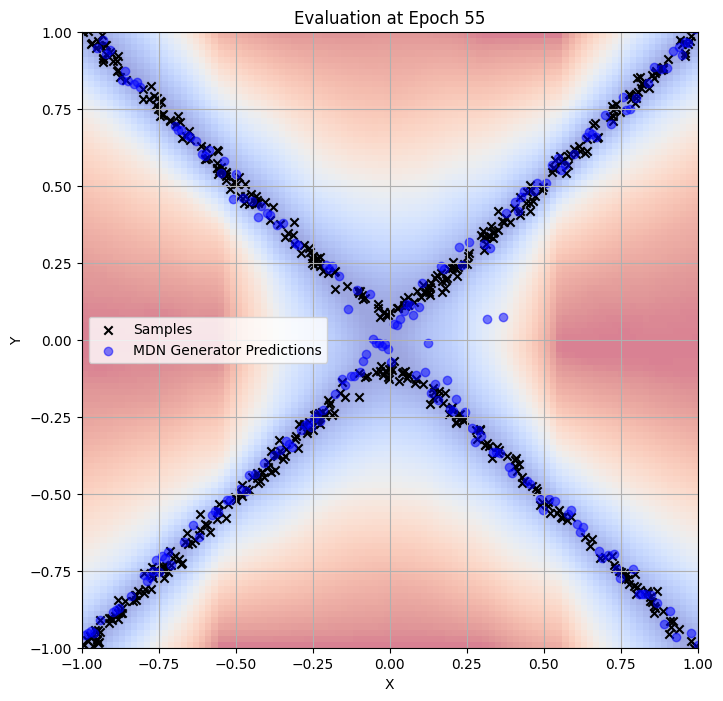

Epoch [56/100], EM Loss: 1.6639, Gen-Energy Loss: 3.0546, MDN Loss: -2.4672, Total Gen Loss: 0.5874
Epoch [57/100], EM Loss: 1.6998, Gen-Energy Loss: 3.3127, MDN Loss: -2.4798, Total Gen Loss: 0.8329
Epoch [58/100], EM Loss: 1.6626, Gen-Energy Loss: 3.2715, MDN Loss: -2.3784, Total Gen Loss: 0.8931
Epoch [59/100], EM Loss: 1.6326, Gen-Energy Loss: 3.3702, MDN Loss: -2.3371, Total Gen Loss: 1.0331
Epoch [60/100], EM Loss: 1.6647, Gen-Energy Loss: 3.6618, MDN Loss: -2.3429, Total Gen Loss: 1.3188


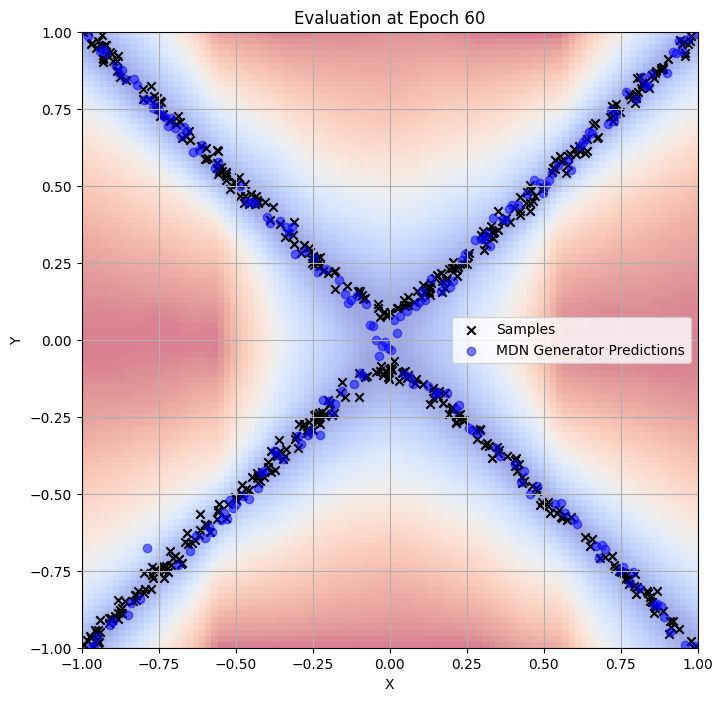

Epoch [61/100], EM Loss: 1.6688, Gen-Energy Loss: 3.3070, MDN Loss: -2.3888, Total Gen Loss: 0.9182
Epoch [62/100], EM Loss: 1.6439, Gen-Energy Loss: 3.1503, MDN Loss: -2.4434, Total Gen Loss: 0.7069
Epoch [63/100], EM Loss: 1.7679, Gen-Energy Loss: 3.3927, MDN Loss: -2.3832, Total Gen Loss: 1.0094
Epoch [64/100], EM Loss: 1.7310, Gen-Energy Loss: 3.0888, MDN Loss: -2.4820, Total Gen Loss: 0.6068
Epoch [65/100], EM Loss: 1.6516, Gen-Energy Loss: 3.5485, MDN Loss: -2.4240, Total Gen Loss: 1.1245


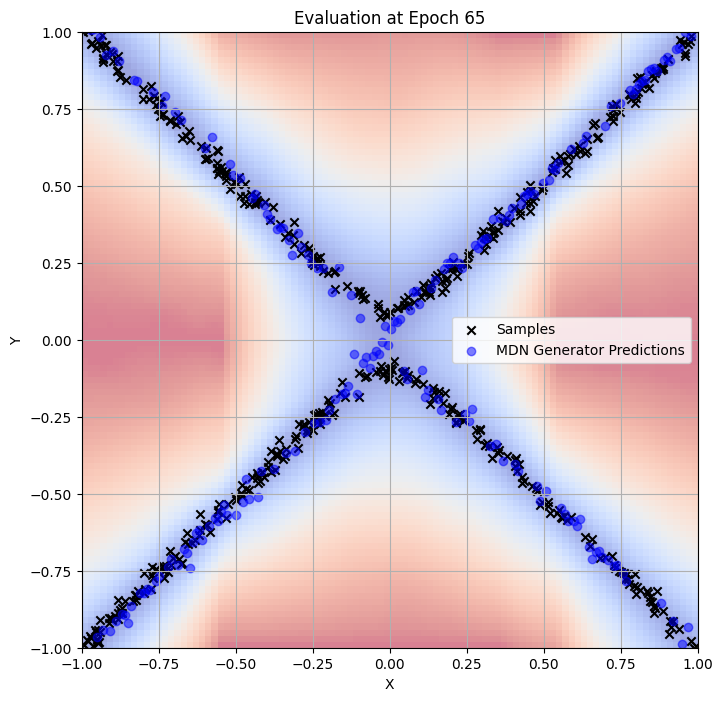

Epoch [66/100], EM Loss: 1.6725, Gen-Energy Loss: 3.6444, MDN Loss: -2.4392, Total Gen Loss: 1.2052
Epoch [67/100], EM Loss: 1.6706, Gen-Energy Loss: 3.3281, MDN Loss: -2.4415, Total Gen Loss: 0.8866
Epoch [68/100], EM Loss: 1.6732, Gen-Energy Loss: 3.5282, MDN Loss: -2.4491, Total Gen Loss: 1.0792
Epoch [69/100], EM Loss: 1.7023, Gen-Energy Loss: 3.4052, MDN Loss: -2.4396, Total Gen Loss: 0.9657
Epoch [70/100], EM Loss: 1.6404, Gen-Energy Loss: 3.4363, MDN Loss: -2.4518, Total Gen Loss: 0.9845


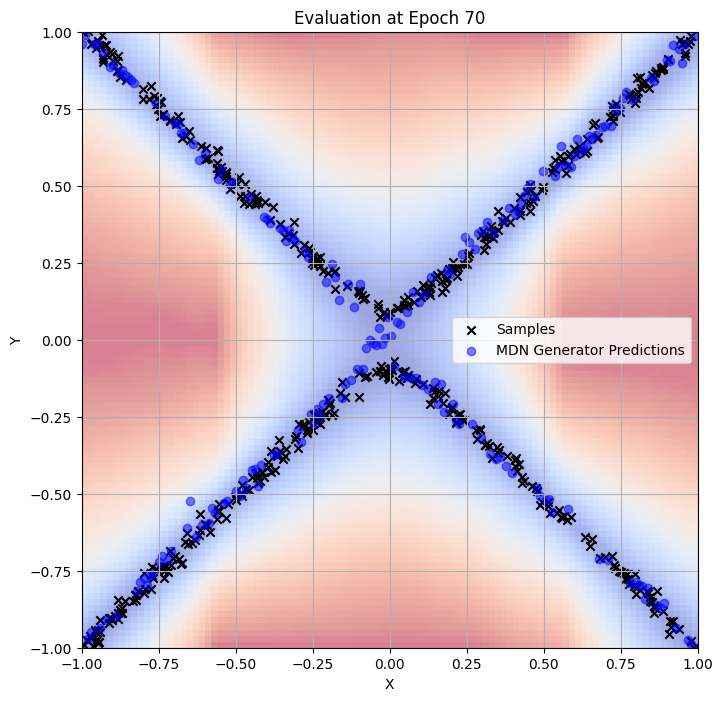

Epoch [71/100], EM Loss: 1.7013, Gen-Energy Loss: 3.7816, MDN Loss: -2.4583, Total Gen Loss: 1.3233
Epoch [72/100], EM Loss: 1.6827, Gen-Energy Loss: 3.6189, MDN Loss: -2.4259, Total Gen Loss: 1.1930
Epoch [73/100], EM Loss: 1.6382, Gen-Energy Loss: 3.5237, MDN Loss: -2.4839, Total Gen Loss: 1.0397
Epoch [74/100], EM Loss: 1.6023, Gen-Energy Loss: 3.6827, MDN Loss: -2.4792, Total Gen Loss: 1.2035
Epoch [75/100], EM Loss: 1.6323, Gen-Energy Loss: 3.9681, MDN Loss: -2.4442, Total Gen Loss: 1.5239


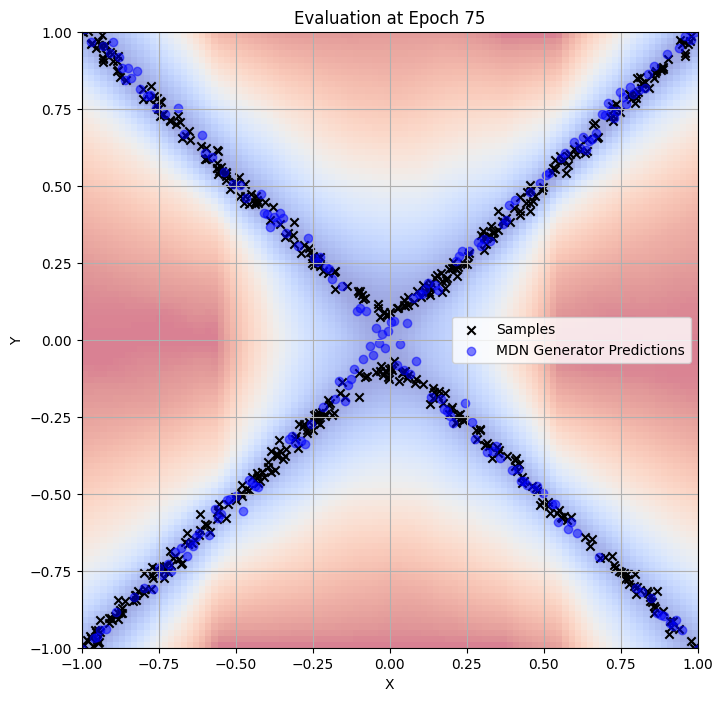

Epoch [76/100], EM Loss: 1.6751, Gen-Energy Loss: 3.4603, MDN Loss: -2.4615, Total Gen Loss: 0.9988
Epoch [77/100], EM Loss: 1.7387, Gen-Energy Loss: 3.7835, MDN Loss: -2.3557, Total Gen Loss: 1.4278
Epoch [78/100], EM Loss: 1.6081, Gen-Energy Loss: 3.9657, MDN Loss: -2.4748, Total Gen Loss: 1.4909
Epoch [79/100], EM Loss: 1.6377, Gen-Energy Loss: 3.8360, MDN Loss: -2.5354, Total Gen Loss: 1.3007
Epoch [80/100], EM Loss: 1.5991, Gen-Energy Loss: 4.0078, MDN Loss: -2.4774, Total Gen Loss: 1.5303


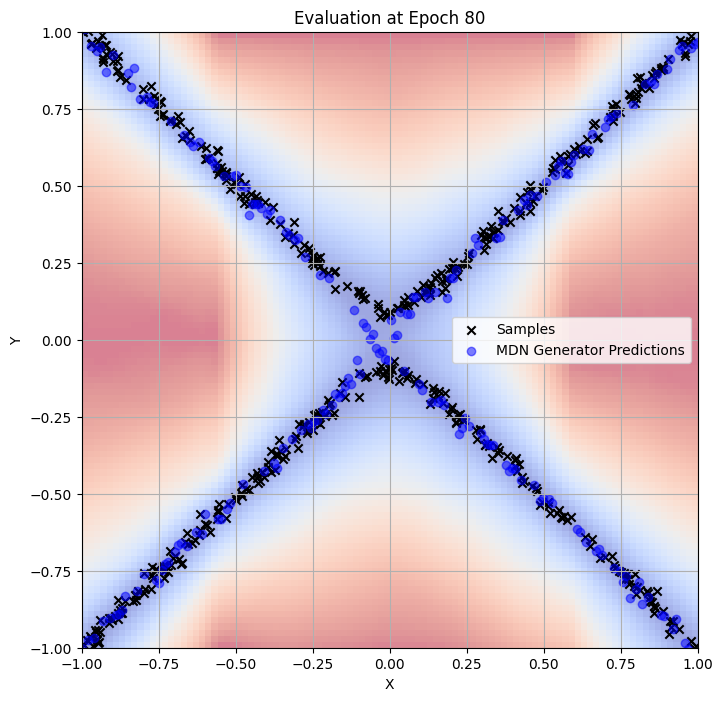

Epoch [81/100], EM Loss: 1.6432, Gen-Energy Loss: 4.3616, MDN Loss: -2.4687, Total Gen Loss: 1.8929
Epoch [82/100], EM Loss: 1.6337, Gen-Energy Loss: 4.1535, MDN Loss: -2.4335, Total Gen Loss: 1.7199
Epoch [83/100], EM Loss: 1.6002, Gen-Energy Loss: 4.3985, MDN Loss: -2.4915, Total Gen Loss: 1.9070
Epoch [84/100], EM Loss: 1.6556, Gen-Energy Loss: 4.2639, MDN Loss: -2.4808, Total Gen Loss: 1.7832
Epoch [85/100], EM Loss: 1.5808, Gen-Energy Loss: 4.0296, MDN Loss: -2.4210, Total Gen Loss: 1.6086


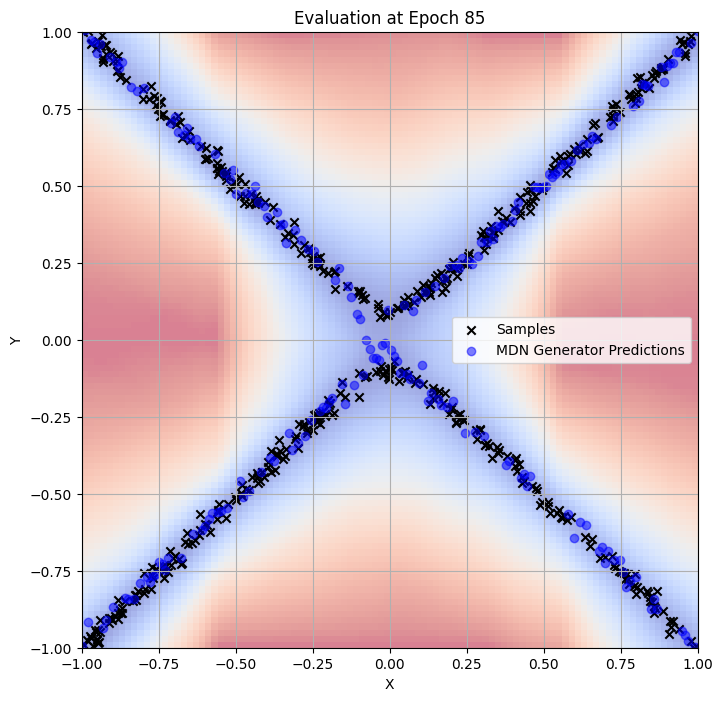

Epoch [86/100], EM Loss: 1.5558, Gen-Energy Loss: 4.3055, MDN Loss: -2.4845, Total Gen Loss: 1.8210
Epoch [87/100], EM Loss: 1.5790, Gen-Energy Loss: 4.3933, MDN Loss: -2.5397, Total Gen Loss: 1.8536
Epoch [88/100], EM Loss: 1.5850, Gen-Energy Loss: 4.5109, MDN Loss: -2.4801, Total Gen Loss: 2.0308
Epoch [89/100], EM Loss: 1.5910, Gen-Energy Loss: 4.5282, MDN Loss: -2.4125, Total Gen Loss: 2.1157
Epoch [90/100], EM Loss: 1.6051, Gen-Energy Loss: 4.5965, MDN Loss: -2.3967, Total Gen Loss: 2.1998


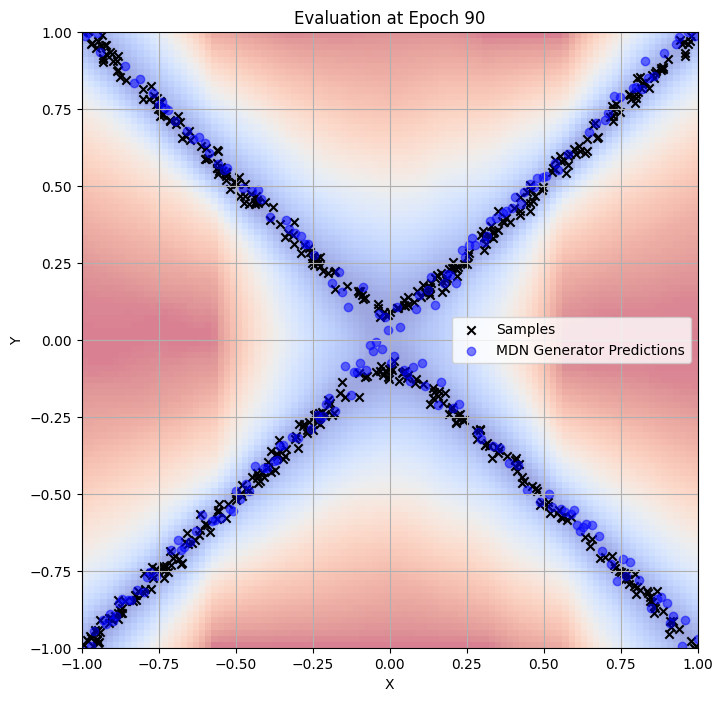

Epoch [91/100], EM Loss: 1.5823, Gen-Energy Loss: 4.6208, MDN Loss: -2.4661, Total Gen Loss: 2.1547
Epoch [92/100], EM Loss: 1.6234, Gen-Energy Loss: 4.6804, MDN Loss: -2.4566, Total Gen Loss: 2.2237
Epoch [93/100], EM Loss: 1.5938, Gen-Energy Loss: 4.7530, MDN Loss: -2.3684, Total Gen Loss: 2.3846
Epoch [94/100], EM Loss: 1.6141, Gen-Energy Loss: 4.8250, MDN Loss: -2.4969, Total Gen Loss: 2.3281
Epoch [95/100], EM Loss: 1.5875, Gen-Energy Loss: 4.7570, MDN Loss: -2.4306, Total Gen Loss: 2.3264


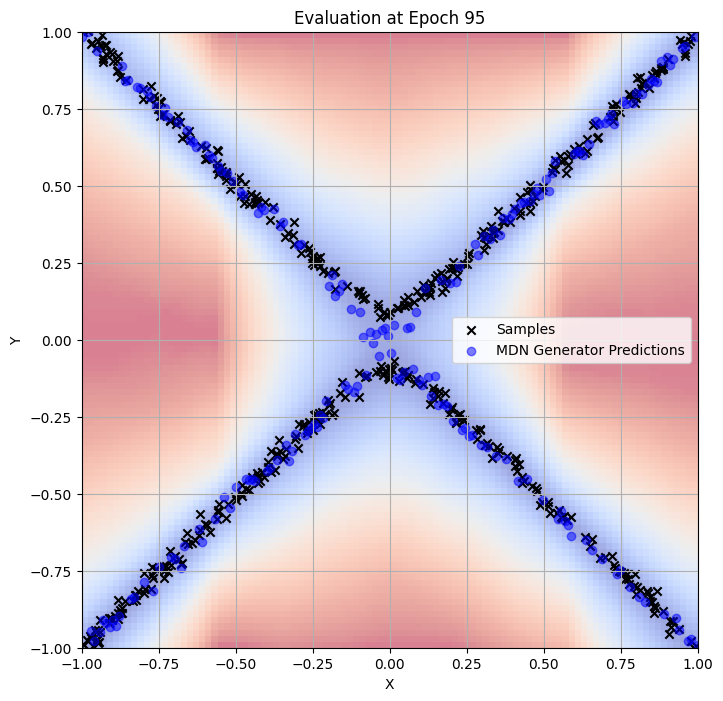

Epoch [96/100], EM Loss: 1.5647, Gen-Energy Loss: 4.5959, MDN Loss: -2.4673, Total Gen Loss: 2.1286
Epoch [97/100], EM Loss: 1.5677, Gen-Energy Loss: 4.5707, MDN Loss: -2.5008, Total Gen Loss: 2.0700
Epoch [98/100], EM Loss: 1.5576, Gen-Energy Loss: 4.7551, MDN Loss: -2.5047, Total Gen Loss: 2.2504
Epoch [99/100], EM Loss: 1.6040, Gen-Energy Loss: 4.6411, MDN Loss: -2.4754, Total Gen Loss: 2.1657
Epoch [100/100], EM Loss: 1.6907, Gen-Energy Loss: 4.6272, MDN Loss: -2.4904, Total Gen Loss: 2.1368


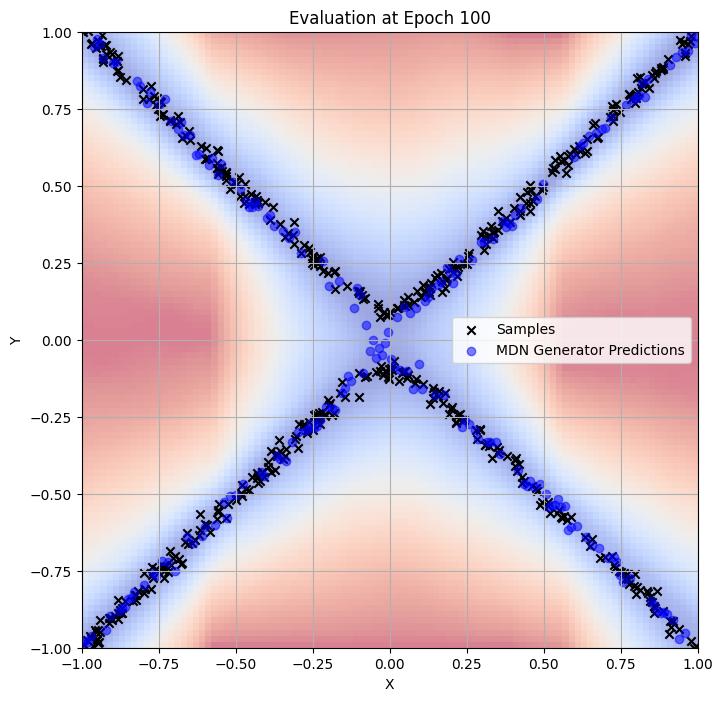

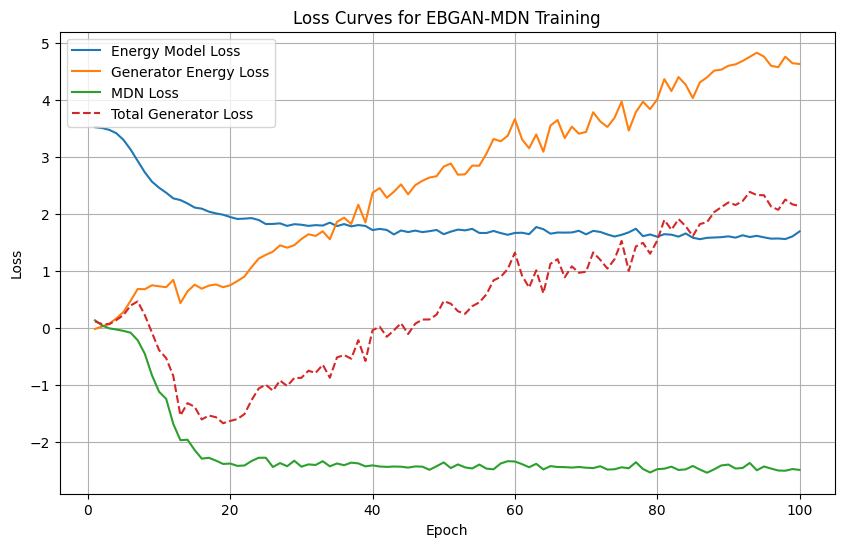

In [183]:
# Initialize a new MDN generator
num_gaussians = 4
ebgan_mdn_generator = MDNGenerator(latent_size, hidden_size, output_size, num_gaussians, condition_size).to(device)
ebgan_energy_model = EnergyModel(condition_size, output_size, hidden_size).to(device)

# Optimizer
optimizer_ebgan_e = optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
optimizer_ebgan_g = optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)

# Train the ebgan model with MDN generator
train_ebgan_mdn(ebgan_energy_model, ebgan_mdn_generator, dataloader, info_nce_loss, optimizer_ebgan_e, optimizer_ebgan_g, num_epochs, y_min.to(device), y_max.to(device), neg_count, device)

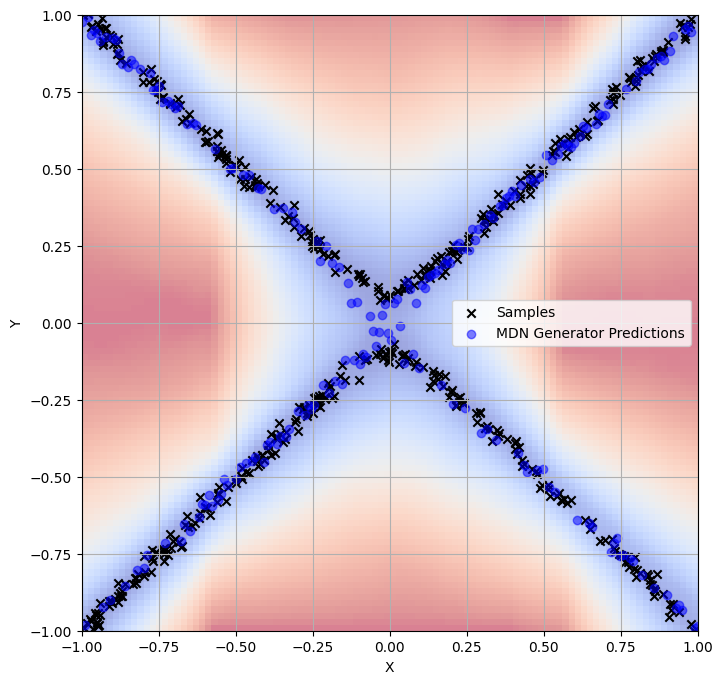

In [184]:

# Generate grid points within the range of x values
x_range = np.linspace(-1, 1, 100)
y_range = np.linspace(-1, 1, 100)
grid_x, grid_y = np.meshgrid(x_range, y_range)
grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

# Compute energy model output for each grid point
energy_outputs = ebgan_energy_model(grid_points[:, :1], grid_points[:, 1:]).detach().cpu().numpy()
energy_outputs = energy_outputs.reshape(100, 100)

# Normalize every column of the heatmap
energy_outputs = (energy_outputs - energy_outputs.min(axis=0)) / (energy_outputs.max(axis=0) - energy_outputs.min(axis=0))

# Plot the heatmap and the function, samples, and predictions in the same figure
fig, ax = plt.subplots(figsize=(8, 8))

# Plot the heatmap
heatmap = ax.imshow(energy_outputs, extent=(-1, 1, -1, 1), origin='lower', cmap='coolwarm', alpha=0.5)
# plt.colorbar(heatmap, ax=ax, label='Energy Model Output')

# Plot the samples
ax.scatter(x, y, marker='x', color='black', label='Samples')

# Random sample the query points and get the predictions using mdn_generator
num_query_points = 200
query_points = np.linspace(-1, 1, num_query_points)
query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
z = torch.randn(num_query_points, latent_size).to(device)

# Generate samples from the mixture model
predictions_mdn = ebgan_mdn_generator.sample(z, query_points_tensor).detach().cpu().numpy()

# Plot the MDN generator predictions
ax.scatter(query_points, predictions_mdn, marker='o', color='blue', label='MDN Generator Predictions', alpha=0.5)

# Set limits to cut the plot within -1, 1
ax.set_xlim(-1, 1)
ax.set_ylim(-1, 1)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.grid()
ax.legend()
plt.show()

Epoch [1/100], EM Loss: 3.5246, Gen-Energy Loss: 0.1102, MDN Loss: 0.1079, Total Gen Loss: 0.2181, Alpha: 0
Epoch [2/100], EM Loss: 3.5051, Gen-Energy Loss: 0.0168, MDN Loss: 0.0258, Total Gen Loss: 0.0427, Alpha: 0
Epoch [3/100], EM Loss: 3.4681, Gen-Energy Loss: -0.0919, MDN Loss: -0.0129, Total Gen Loss: -0.1048, Alpha: 0
Epoch [4/100], EM Loss: 3.4070, Gen-Energy Loss: -0.2609, MDN Loss: -0.0287, Total Gen Loss: -0.2896, Alpha: 0
Epoch [5/100], EM Loss: 3.3008, Gen-Energy Loss: -0.4458, MDN Loss: -0.0534, Total Gen Loss: -0.4992, Alpha: 0


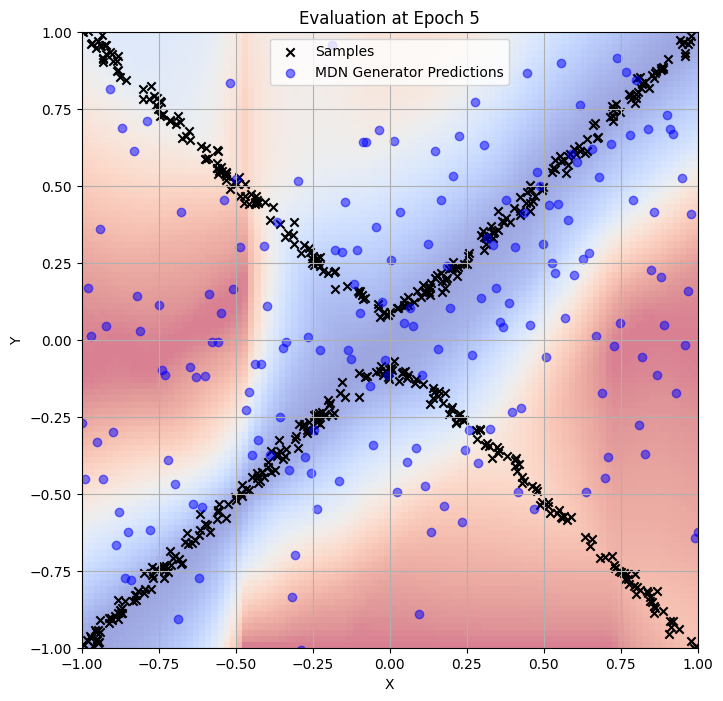

Epoch [6/100], EM Loss: 3.1578, Gen-Energy Loss: -0.7164, MDN Loss: -0.0853, Total Gen Loss: -0.8018, Alpha: 0
Epoch [7/100], EM Loss: 2.9900, Gen-Energy Loss: -1.0847, MDN Loss: -0.1793, Total Gen Loss: -1.2640, Alpha: 0
Epoch [8/100], EM Loss: 2.7934, Gen-Energy Loss: -1.7728, MDN Loss: -0.4634, Total Gen Loss: -2.2362, Alpha: 0
Epoch [9/100], EM Loss: 2.6150, Gen-Energy Loss: -2.4989, MDN Loss: -1.1296, Total Gen Loss: -3.6285, Alpha: 0
Epoch [10/100], EM Loss: 2.4424, Gen-Energy Loss: -3.3133, MDN Loss: -1.7419, Total Gen Loss: -5.0552, Alpha: 0


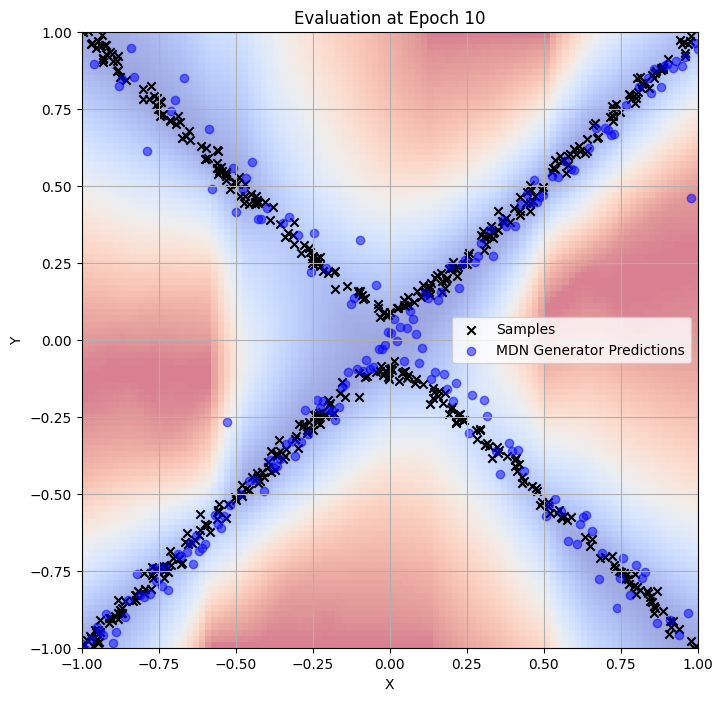

Epoch [11/100], EM Loss: 2.3407, Gen-Energy Loss: -3.6683, MDN Loss: -2.0678, Total Gen Loss: -5.7361, Alpha: 0
Epoch [12/100], EM Loss: 2.2487, Gen-Energy Loss: -4.0118, MDN Loss: -1.9827, Total Gen Loss: -5.9945, Alpha: 0
Epoch [13/100], EM Loss: 2.1447, Gen-Energy Loss: -4.2480, MDN Loss: -2.1636, Total Gen Loss: -6.4116, Alpha: 0
Epoch [14/100], EM Loss: 2.0864, Gen-Energy Loss: -4.6071, MDN Loss: -2.2440, Total Gen Loss: -6.8511, Alpha: 0
Epoch [15/100], EM Loss: 2.0104, Gen-Energy Loss: -4.9369, MDN Loss: -2.2759, Total Gen Loss: -7.2128, Alpha: 0


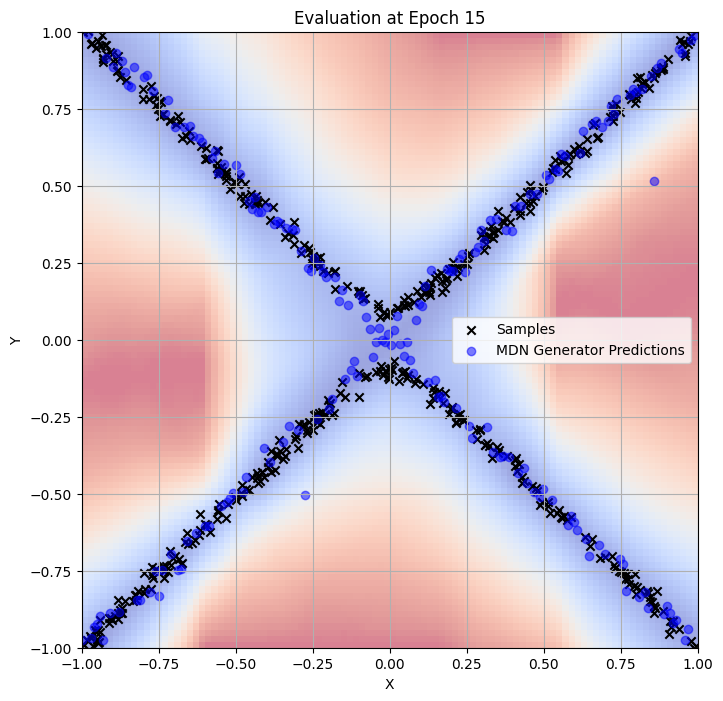

Epoch [16/100], EM Loss: 2.0071, Gen-Energy Loss: -5.2280, MDN Loss: -2.3189, Total Gen Loss: -7.5469, Alpha: 0
Epoch [17/100], EM Loss: 1.9378, Gen-Energy Loss: -5.4473, MDN Loss: -2.2906, Total Gen Loss: -7.7379, Alpha: 0
Epoch [18/100], EM Loss: 1.8617, Gen-Energy Loss: -5.7224, MDN Loss: -2.2628, Total Gen Loss: -7.9852, Alpha: 0
Epoch [19/100], EM Loss: 1.8216, Gen-Energy Loss: -6.0091, MDN Loss: -2.2079, Total Gen Loss: -8.2170, Alpha: 0
Epoch [20/100], EM Loss: 1.8334, Gen-Energy Loss: -6.3116, MDN Loss: -2.2206, Total Gen Loss: -8.5322, Alpha: 0


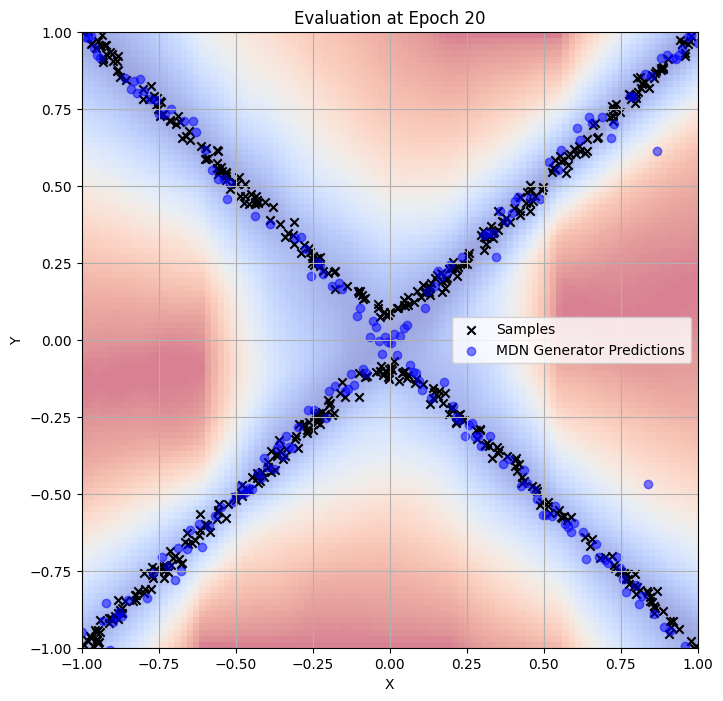

Epoch [21/100], EM Loss: 1.8016, Gen-Energy Loss: -6.3469, MDN Loss: -2.3726, Total Gen Loss: -8.7195, Alpha: 0
Epoch [22/100], EM Loss: 1.7738, Gen-Energy Loss: -6.7024, MDN Loss: -2.2870, Total Gen Loss: -8.9894, Alpha: 0
Epoch [23/100], EM Loss: 1.7640, Gen-Energy Loss: -6.7345, MDN Loss: -2.3629, Total Gen Loss: -9.0974, Alpha: 0
Epoch [24/100], EM Loss: 1.7278, Gen-Energy Loss: -6.6358, MDN Loss: -2.2532, Total Gen Loss: -8.8891, Alpha: 0
Epoch [25/100], EM Loss: 1.7050, Gen-Energy Loss: -6.9777, MDN Loss: -2.3046, Total Gen Loss: -9.2822, Alpha: 0


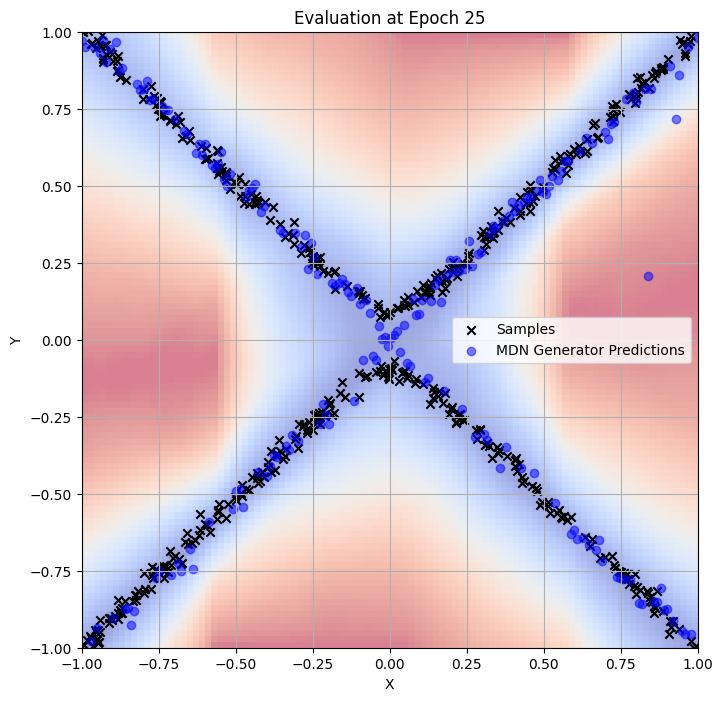

Epoch [26/100], EM Loss: 1.6798, Gen-Energy Loss: -7.0758, MDN Loss: -2.3743, Total Gen Loss: -9.4501, Alpha: 0
Epoch [27/100], EM Loss: 1.6684, Gen-Energy Loss: -7.2096, MDN Loss: -2.3744, Total Gen Loss: -9.5840, Alpha: 0
Epoch [28/100], EM Loss: 1.6078, Gen-Energy Loss: -7.3622, MDN Loss: -2.3243, Total Gen Loss: -9.6865, Alpha: 0
Epoch [29/100], EM Loss: 1.6305, Gen-Energy Loss: -7.4825, MDN Loss: -2.3535, Total Gen Loss: -9.8361, Alpha: 0
Epoch [30/100], EM Loss: 1.6097, Gen-Energy Loss: -7.4698, MDN Loss: -2.3305, Total Gen Loss: -9.8003, Alpha: 0


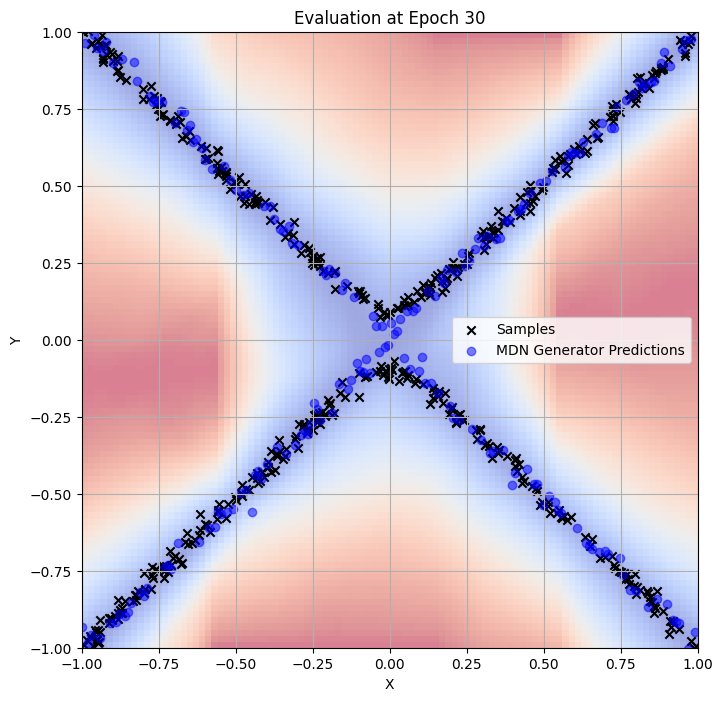

Epoch [31/100], EM Loss: 1.5899, Gen-Energy Loss: -7.3685, MDN Loss: -2.3631, Total Gen Loss: -9.7316, Alpha: 0
Epoch [32/100], EM Loss: 1.5984, Gen-Energy Loss: -7.8520, MDN Loss: -2.3608, Total Gen Loss: -10.2128, Alpha: 0
Epoch [33/100], EM Loss: 1.5742, Gen-Energy Loss: -7.7045, MDN Loss: -2.3515, Total Gen Loss: -10.0559, Alpha: 0
Epoch [34/100], EM Loss: 1.5839, Gen-Energy Loss: -7.7429, MDN Loss: -2.2672, Total Gen Loss: -10.0101, Alpha: 0
Epoch [35/100], EM Loss: 1.5963, Gen-Energy Loss: -7.8646, MDN Loss: -2.3714, Total Gen Loss: -10.2360, Alpha: 0


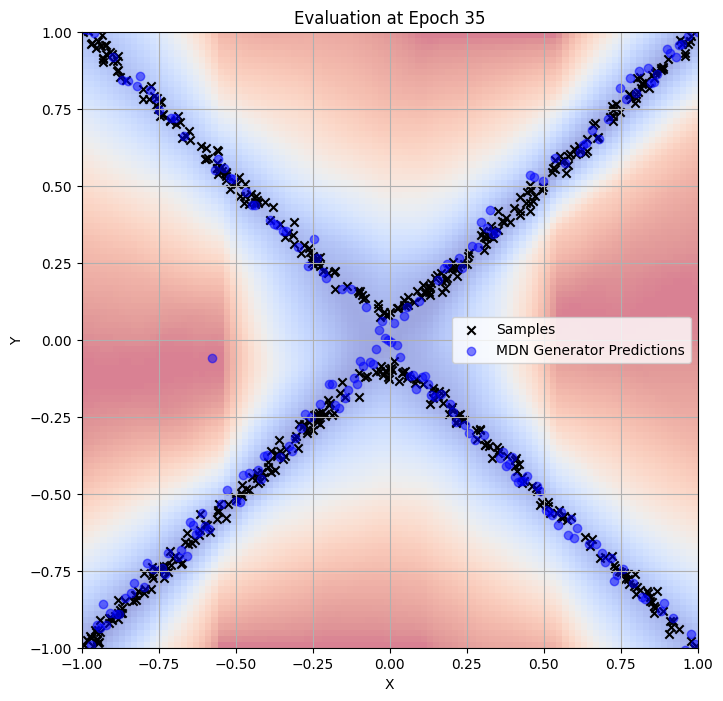

Epoch [36/100], EM Loss: 1.5968, Gen-Energy Loss: -7.9270, MDN Loss: -2.3160, Total Gen Loss: -10.2430, Alpha: 0
Epoch [37/100], EM Loss: 1.5841, Gen-Energy Loss: -7.8050, MDN Loss: -2.3765, Total Gen Loss: -10.1815, Alpha: 0
Epoch [38/100], EM Loss: 1.5914, Gen-Energy Loss: -7.8784, MDN Loss: -2.3545, Total Gen Loss: -10.2329, Alpha: 0
Epoch [39/100], EM Loss: 1.5997, Gen-Energy Loss: -7.8352, MDN Loss: -2.3450, Total Gen Loss: -10.1803, Alpha: 0
Epoch [40/100], EM Loss: 1.5634, Gen-Energy Loss: -7.8196, MDN Loss: -2.2935, Total Gen Loss: -10.1131, Alpha: 0


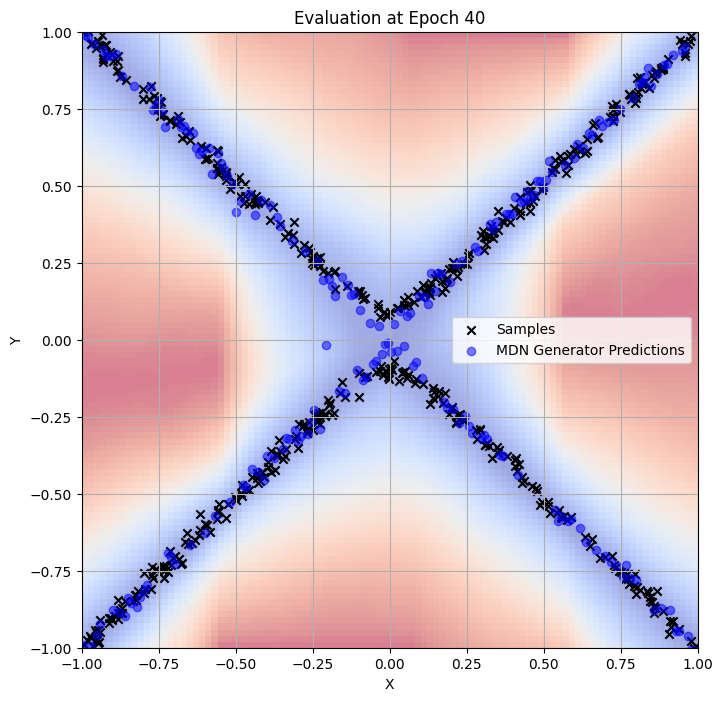

Epoch [41/100], EM Loss: 1.5524, Gen-Energy Loss: -7.6661, MDN Loss: -2.3880, Total Gen Loss: -10.0541, Alpha: 0
Epoch [42/100], EM Loss: 1.5499, Gen-Energy Loss: -7.7829, MDN Loss: -2.3613, Total Gen Loss: -10.1442, Alpha: 0
Epoch [43/100], EM Loss: 1.5416, Gen-Energy Loss: -7.8060, MDN Loss: -2.3891, Total Gen Loss: -10.1952, Alpha: 0
Epoch [44/100], EM Loss: 1.5099, Gen-Energy Loss: -7.8775, MDN Loss: -2.3768, Total Gen Loss: -10.2543, Alpha: 0
Epoch [45/100], EM Loss: 1.4852, Gen-Energy Loss: -7.9009, MDN Loss: -2.3807, Total Gen Loss: -10.2817, Alpha: 0


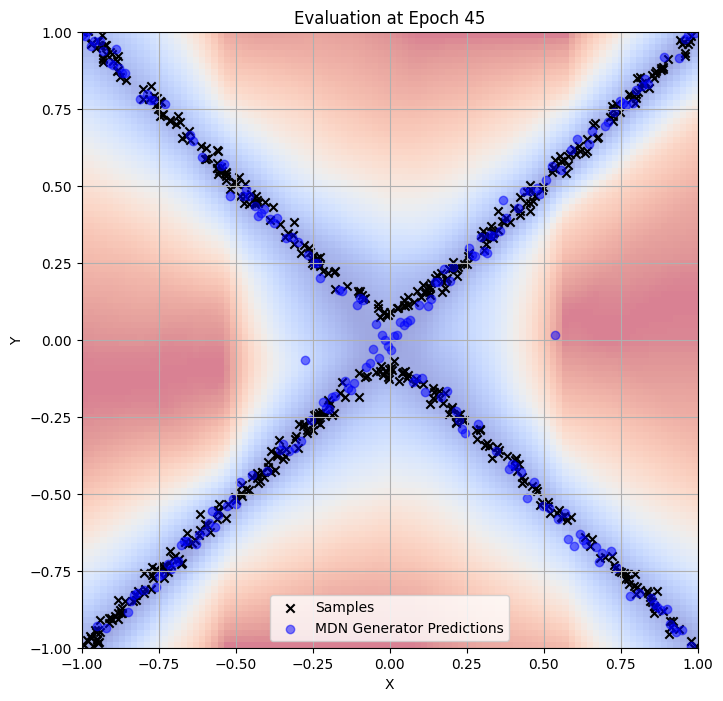

Epoch [46/100], EM Loss: 1.5159, Gen-Energy Loss: -8.3095, MDN Loss: -2.3580, Total Gen Loss: -10.6675, Alpha: 0
Epoch [47/100], EM Loss: 1.5386, Gen-Energy Loss: -8.1935, MDN Loss: -2.3733, Total Gen Loss: -10.5668, Alpha: 0
Epoch [48/100], EM Loss: 1.4843, Gen-Energy Loss: -8.2692, MDN Loss: -2.3546, Total Gen Loss: -10.6238, Alpha: 0
Epoch [49/100], EM Loss: 1.4620, Gen-Energy Loss: -8.2086, MDN Loss: -2.3956, Total Gen Loss: -10.6042, Alpha: 0
Epoch [50/100], EM Loss: 1.4793, Gen-Energy Loss: -8.1745, MDN Loss: -2.3973, Total Gen Loss: -10.5719, Alpha: 0


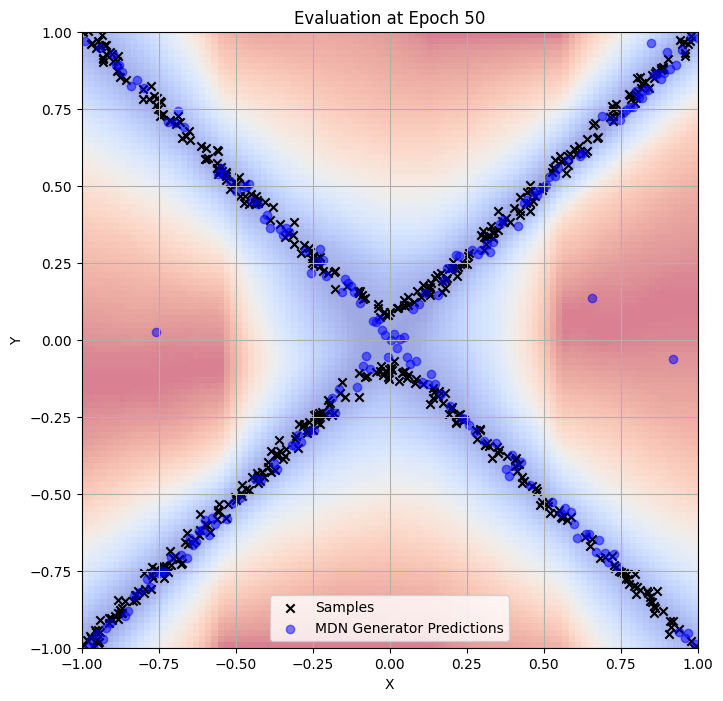

Epoch [51/100], EM Loss: 1.4810, Gen-Energy Loss: -8.1278, MDN Loss: -2.3706, Total Gen Loss: -10.4984, Alpha: 0
Epoch [52/100], EM Loss: 1.4952, Gen-Energy Loss: -8.3893, MDN Loss: -2.3539, Total Gen Loss: -10.7431, Alpha: 0
Epoch [53/100], EM Loss: 1.4721, Gen-Energy Loss: -8.2223, MDN Loss: -2.3350, Total Gen Loss: -10.5573, Alpha: 0
Epoch [54/100], EM Loss: 1.4381, Gen-Energy Loss: -8.2758, MDN Loss: -2.3686, Total Gen Loss: -10.6444, Alpha: 0
Epoch [55/100], EM Loss: 1.4590, Gen-Energy Loss: -8.5091, MDN Loss: -2.3955, Total Gen Loss: -10.9047, Alpha: 0


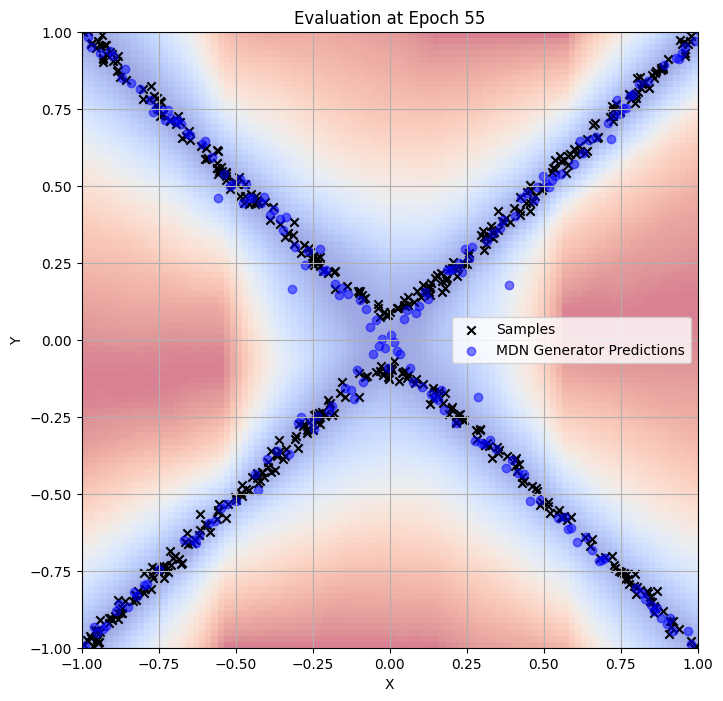

Epoch [56/100], EM Loss: 1.4642, Gen-Energy Loss: -8.5349, MDN Loss: -2.4074, Total Gen Loss: -10.9422, Alpha: 0
Epoch [57/100], EM Loss: 1.4695, Gen-Energy Loss: -8.4847, MDN Loss: -2.3818, Total Gen Loss: -10.8665, Alpha: 0
Epoch [58/100], EM Loss: 1.4492, Gen-Energy Loss: -8.6079, MDN Loss: -2.4206, Total Gen Loss: -11.0285, Alpha: 0
Epoch [59/100], EM Loss: 1.4369, Gen-Energy Loss: -8.8172, MDN Loss: -2.4043, Total Gen Loss: -11.2214, Alpha: 0
Epoch [60/100], EM Loss: 1.4878, Gen-Energy Loss: -8.5435, MDN Loss: -2.3779, Total Gen Loss: -10.9214, Alpha: 0


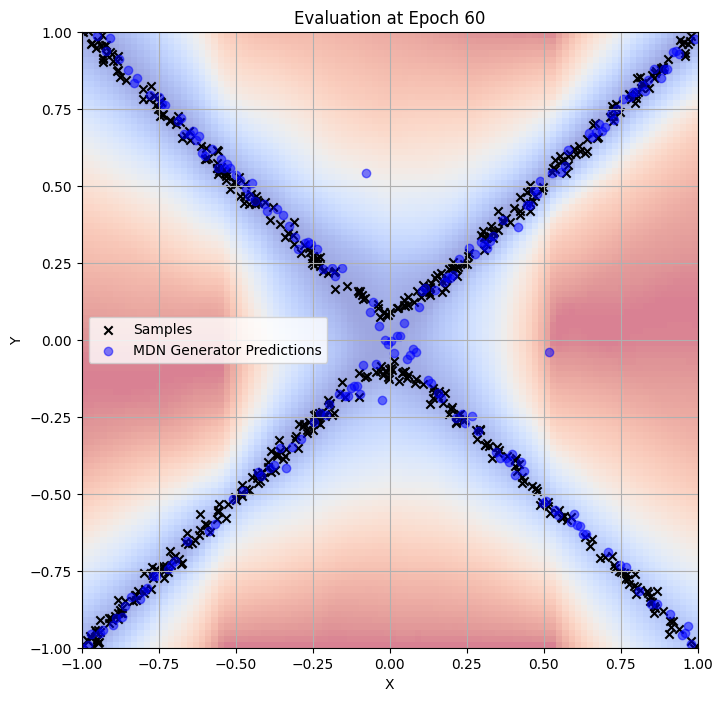

Epoch [61/100], EM Loss: 1.5516, Gen-Energy Loss: -8.5138, MDN Loss: -2.2356, Total Gen Loss: -10.7494, Alpha: 0
Epoch [62/100], EM Loss: 1.4676, Gen-Energy Loss: -8.2945, MDN Loss: -2.2752, Total Gen Loss: -10.5697, Alpha: 0
Epoch [63/100], EM Loss: 1.5324, Gen-Energy Loss: -8.5100, MDN Loss: -2.3773, Total Gen Loss: -10.8873, Alpha: 0
Epoch [64/100], EM Loss: 1.4728, Gen-Energy Loss: -8.6136, MDN Loss: -2.4111, Total Gen Loss: -11.0247, Alpha: 0
Epoch [65/100], EM Loss: 1.4602, Gen-Energy Loss: -8.4404, MDN Loss: -2.4013, Total Gen Loss: -10.8416, Alpha: 0


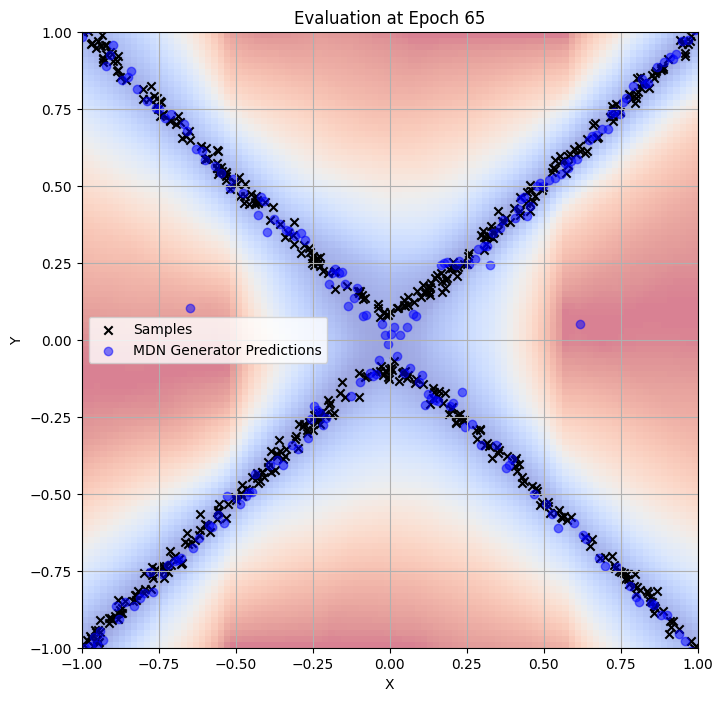

Epoch [66/100], EM Loss: 1.5315, Gen-Energy Loss: -8.5326, MDN Loss: -2.2953, Total Gen Loss: -10.8280, Alpha: 0
Epoch [67/100], EM Loss: 1.3921, Gen-Energy Loss: -8.5809, MDN Loss: -2.4022, Total Gen Loss: -10.9831, Alpha: 0
Epoch [68/100], EM Loss: 1.4181, Gen-Energy Loss: -8.7514, MDN Loss: -2.3844, Total Gen Loss: -11.1359, Alpha: 0
Epoch [69/100], EM Loss: 1.4090, Gen-Energy Loss: -8.7177, MDN Loss: -2.4305, Total Gen Loss: -11.1482, Alpha: 0
Epoch [70/100], EM Loss: 1.3903, Gen-Energy Loss: -8.8511, MDN Loss: -2.4547, Total Gen Loss: -11.3058, Alpha: 0


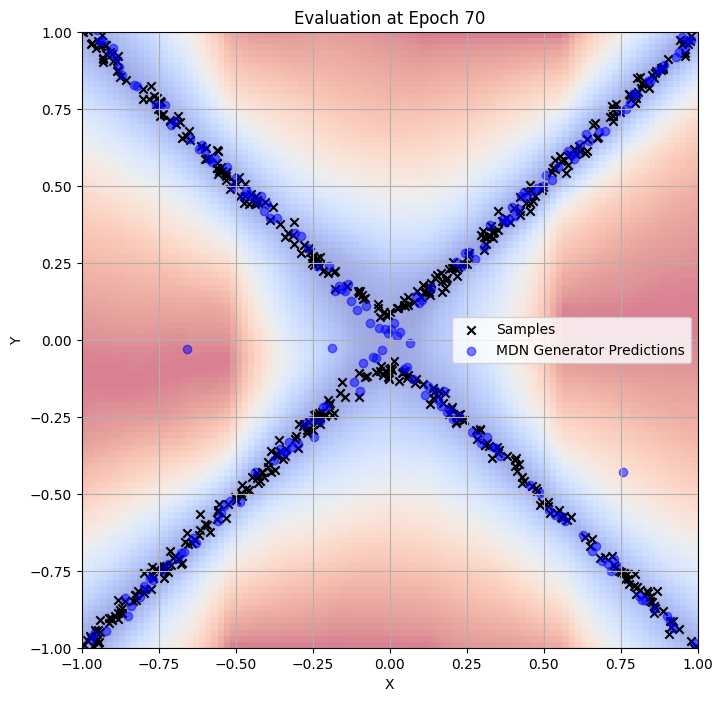

Epoch [71/100], EM Loss: 1.4550, Gen-Energy Loss: -8.7759, MDN Loss: -2.3853, Total Gen Loss: -11.1612, Alpha: 0
Epoch [72/100], EM Loss: 1.4523, Gen-Energy Loss: -9.4670, MDN Loss: -2.3090, Total Gen Loss: -11.7759, Alpha: 0
Epoch [73/100], EM Loss: 1.4469, Gen-Energy Loss: -8.6558, MDN Loss: -2.3265, Total Gen Loss: -10.9823, Alpha: 0
Epoch [74/100], EM Loss: 1.4582, Gen-Energy Loss: -8.8272, MDN Loss: -2.3841, Total Gen Loss: -11.2113, Alpha: 0
Epoch [75/100], EM Loss: 1.3956, Gen-Energy Loss: -8.8021, MDN Loss: -2.4028, Total Gen Loss: -11.2048, Alpha: 0


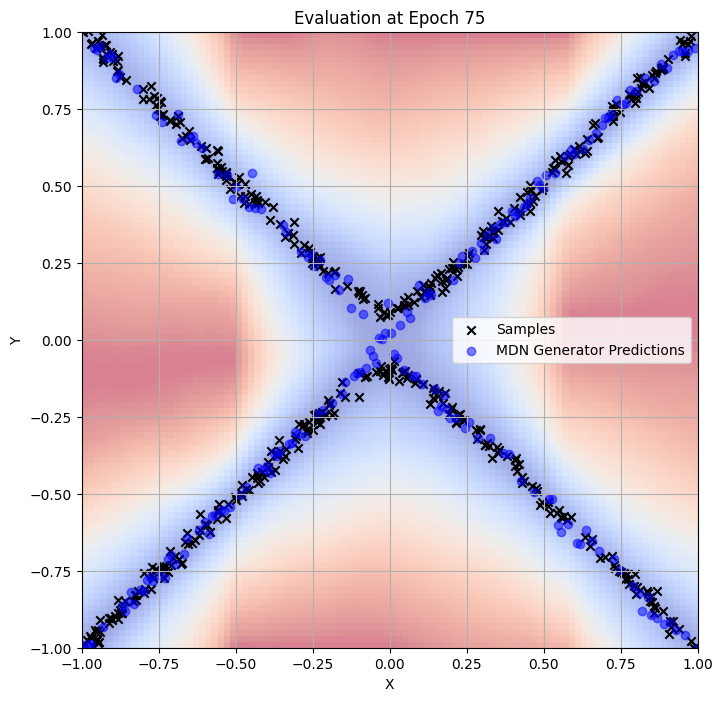

Epoch [76/100], EM Loss: 1.4367, Gen-Energy Loss: -8.7525, MDN Loss: -2.3942, Total Gen Loss: -11.1467, Alpha: 0
Epoch [77/100], EM Loss: 1.3966, Gen-Energy Loss: -8.7760, MDN Loss: -2.4403, Total Gen Loss: -11.2163, Alpha: 0
Epoch [78/100], EM Loss: 1.4237, Gen-Energy Loss: -9.2485, MDN Loss: -2.4002, Total Gen Loss: -11.6486, Alpha: 0
Epoch [79/100], EM Loss: 1.3616, Gen-Energy Loss: -9.2753, MDN Loss: -2.3932, Total Gen Loss: -11.6685, Alpha: 0
Epoch [80/100], EM Loss: 1.4057, Gen-Energy Loss: -9.3584, MDN Loss: -2.3965, Total Gen Loss: -11.7548, Alpha: 0


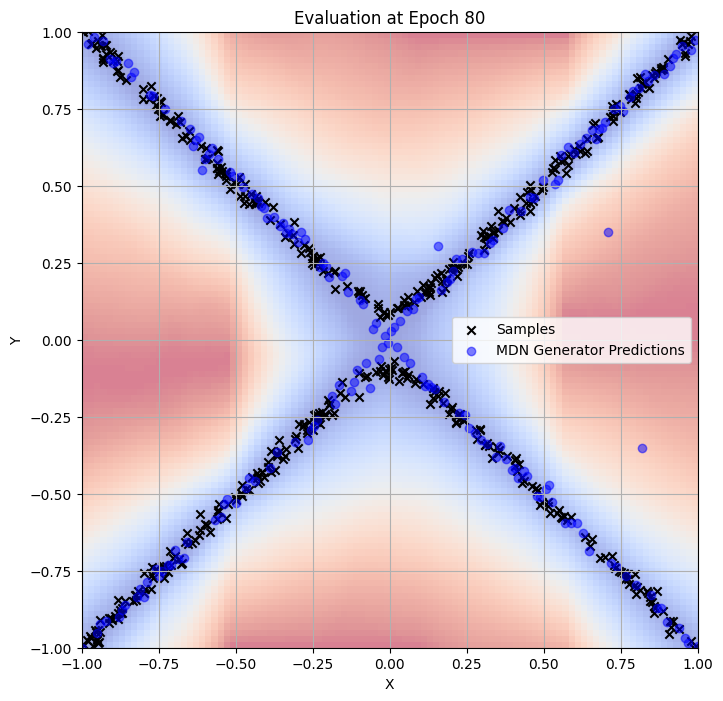

Epoch [81/100], EM Loss: 1.3755, Gen-Energy Loss: -9.0079, MDN Loss: -2.3208, Total Gen Loss: -11.3287, Alpha: 0
Epoch [82/100], EM Loss: 1.4649, Gen-Energy Loss: -8.9999, MDN Loss: -2.3601, Total Gen Loss: -11.3599, Alpha: 0
Epoch [83/100], EM Loss: 1.4343, Gen-Energy Loss: -8.8423, MDN Loss: -2.3869, Total Gen Loss: -11.2292, Alpha: 0
Epoch [84/100], EM Loss: 1.4040, Gen-Energy Loss: -9.1924, MDN Loss: -2.4619, Total Gen Loss: -11.6544, Alpha: 0
Epoch [85/100], EM Loss: 1.3487, Gen-Energy Loss: -8.9162, MDN Loss: -2.3760, Total Gen Loss: -11.2922, Alpha: 0


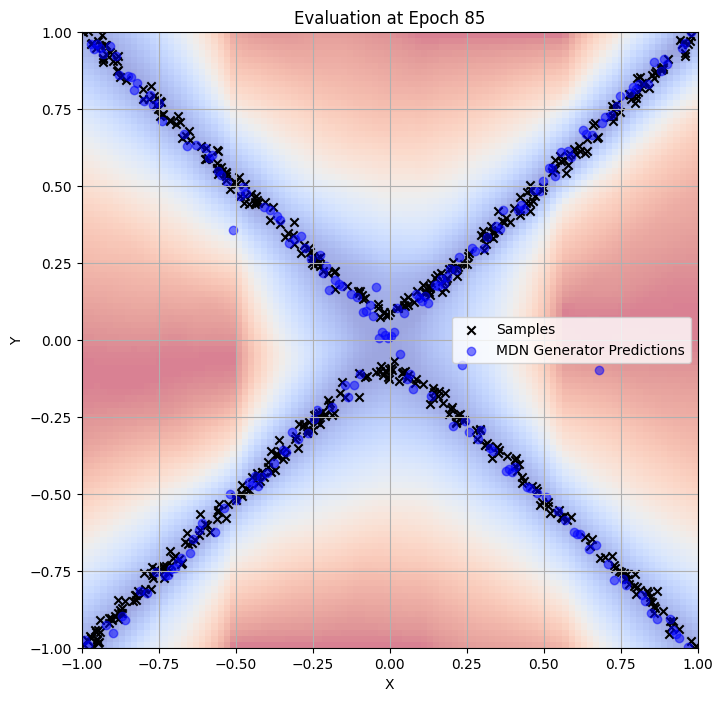

Epoch [86/100], EM Loss: 1.3712, Gen-Energy Loss: -9.2307, MDN Loss: -2.4091, Total Gen Loss: -11.6398, Alpha: 0
Epoch [87/100], EM Loss: 1.4242, Gen-Energy Loss: -9.4565, MDN Loss: -2.3780, Total Gen Loss: -11.8346, Alpha: 0
Epoch [88/100], EM Loss: 1.3963, Gen-Energy Loss: -9.2476, MDN Loss: -2.3669, Total Gen Loss: -11.6145, Alpha: 0
Epoch [89/100], EM Loss: 1.4075, Gen-Energy Loss: -9.6157, MDN Loss: -2.4247, Total Gen Loss: -12.0404, Alpha: 0
Epoch [90/100], EM Loss: 1.4770, Gen-Energy Loss: -9.2030, MDN Loss: -2.3938, Total Gen Loss: -11.5968, Alpha: 0


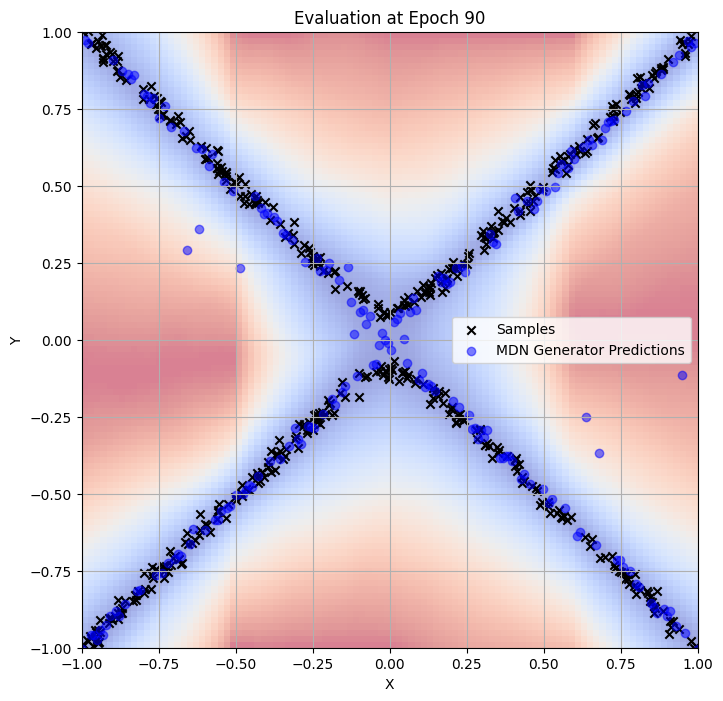

Epoch [91/100], EM Loss: 1.3574, Gen-Energy Loss: -9.4460, MDN Loss: -2.4042, Total Gen Loss: -11.8502, Alpha: 0
Epoch [92/100], EM Loss: 1.3777, Gen-Energy Loss: -9.0010, MDN Loss: -2.4301, Total Gen Loss: -11.4311, Alpha: 0
Epoch [93/100], EM Loss: 1.4085, Gen-Energy Loss: -9.3244, MDN Loss: -2.3695, Total Gen Loss: -11.6939, Alpha: 0
Epoch [94/100], EM Loss: 1.3559, Gen-Energy Loss: -9.1744, MDN Loss: -2.3415, Total Gen Loss: -11.5159, Alpha: 0
Epoch [95/100], EM Loss: 1.3703, Gen-Energy Loss: -9.4652, MDN Loss: -2.4437, Total Gen Loss: -11.9089, Alpha: 0


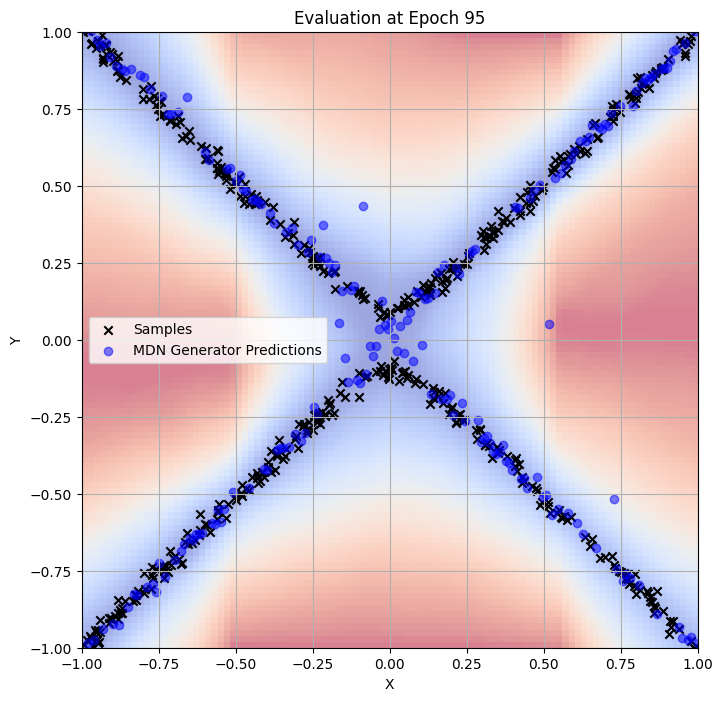

Epoch [96/100], EM Loss: 1.4096, Gen-Energy Loss: -9.7622, MDN Loss: -2.3804, Total Gen Loss: -12.1426, Alpha: 0
Epoch [97/100], EM Loss: 1.4030, Gen-Energy Loss: -9.5464, MDN Loss: -2.4054, Total Gen Loss: -11.9518, Alpha: 0
Epoch [98/100], EM Loss: 1.4612, Gen-Energy Loss: -9.7615, MDN Loss: -2.3906, Total Gen Loss: -12.1521, Alpha: 0
Epoch [99/100], EM Loss: 1.3845, Gen-Energy Loss: -9.8074, MDN Loss: -2.4460, Total Gen Loss: -12.2534, Alpha: 0
Epoch [100/100], EM Loss: 1.3884, Gen-Energy Loss: -9.9393, MDN Loss: -2.4690, Total Gen Loss: -12.4083, Alpha: 0


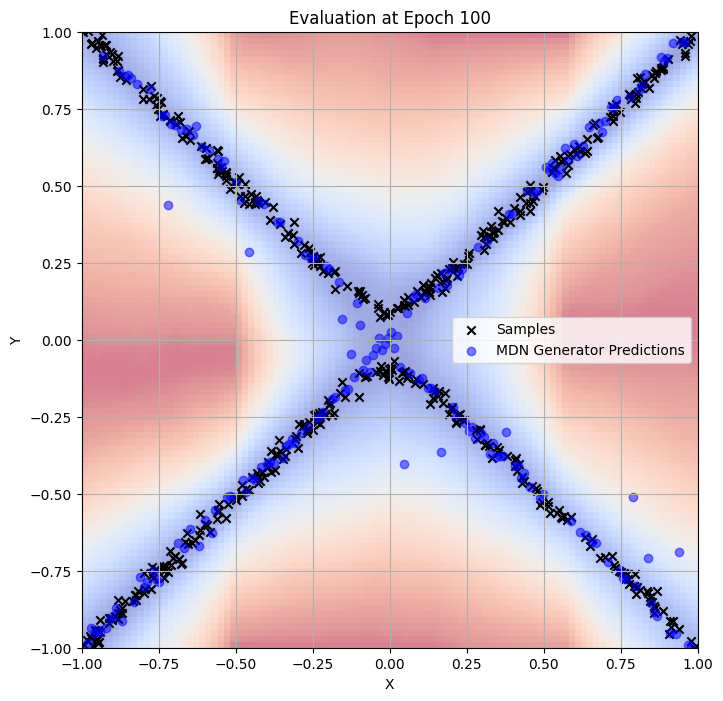

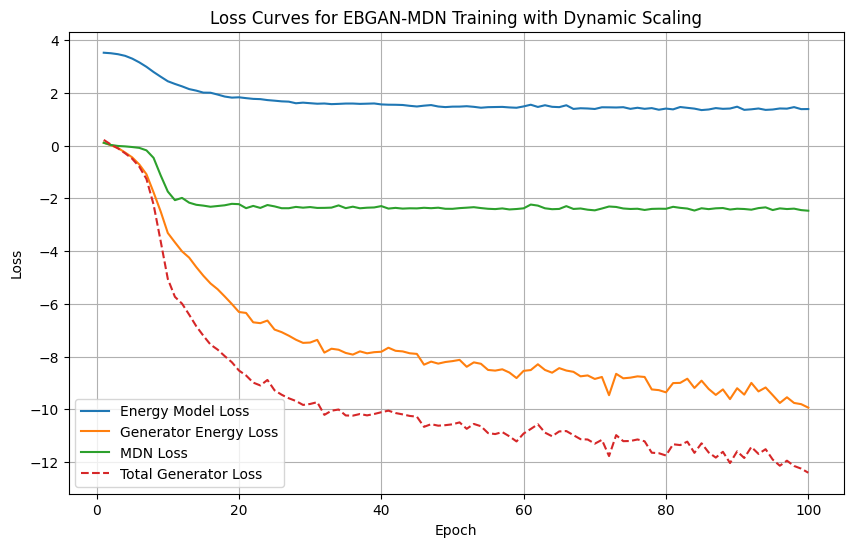

In [185]:
# Define Energy-based Model using MLP
class EnergyModel(nn.Module):
    def __init__(self, input_size, action_size, hidden_size):
        super(EnergyModel, self).__init__()
        self.energy_net = nn.Sequential(
            nn.Linear(input_size + action_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, 1)
        )

    def forward(self, x, y):
        combined = torch.cat([x, y], dim=-1)
        return self.energy_net(combined).squeeze(-1)

# Define MDN Generator
class MDNGenerator(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_gaussians, condition_size, noise_type=NoiseType.ISOTROPIC, fixed_noise_level=None):
        super(MDNGenerator, self).__init__()
        assert (fixed_noise_level is not None) == (noise_type is NoiseType.FIXED)
        self.latent_size = input_size
        self.num_gaussians = num_gaussians
        self.noise_type = noise_type
        self.fixed_noise_level = fixed_noise_level
        num_sigma_channels = {
            NoiseType.DIAGONAL: output_size * num_gaussians,
            NoiseType.ISOTROPIC: num_gaussians,
            NoiseType.ISOTROPIC_ACROSS_CLUSTERS: 1,
            NoiseType.FIXED: 0,
        }[noise_type]
        self.hidden = nn.Sequential(
            nn.Linear(input_size + condition_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU()
        )
        self.pi = nn.Linear(hidden_size, num_gaussians)
        self.normal_network = nn.Linear(hidden_size, output_size * num_gaussians + num_sigma_channels)

    def forward(self, x, condition, eps=1e-6):
        x = torch.cat([x, condition], dim=1)
        hidden = self.hidden(x)
        log_pi = torch.log_softmax(self.pi(hidden), dim=1)
        normal_params = self.normal_network(hidden)
        mu = normal_params[..., :self.num_gaussians * output_size]
        sigma = normal_params[..., self.num_gaussians * output_size:]
        if self.noise_type is NoiseType.DIAGONAL:
            sigma = torch.exp(sigma + eps)
        if self.noise_type is NoiseType.ISOTROPIC:
            sigma = torch.exp(sigma + eps).repeat(1, output_size)
        if self.noise_type is NoiseType.ISOTROPIC_ACROSS_CLUSTERS:
            sigma = torch.exp(sigma + eps).repeat(1, self.num_gaussians * output_size)
        if self.noise_type is NoiseType.FIXED:
            sigma = torch.full_like(mu, fill_value=self.fixed_noise_level)
        mu = mu.view(-1, self.num_gaussians, output_size)
        sigma = sigma.view(-1, self.num_gaussians, output_size)
        return log_pi, mu, sigma
    
    def sample(self, x, condition):
        log_pi, mu, sigma = self.forward(x, condition)
        cum_pi = torch.cumsum(torch.exp(log_pi), dim=-1)
        rvs = torch.rand(len(x), 1).to(x.device)
        rand_pi = torch.searchsorted(cum_pi, rvs)
        rand_normal = torch.randn_like(mu) * sigma + mu
        samples = torch.gather(rand_normal, 1, rand_pi.unsqueeze(-1).expand(-1, -1, mu.size(-1))).squeeze(1)
        return samples

def mdn_loss(log_pi, mu, sigma, y):
    z_score = (y.unsqueeze(1) - mu) / sigma
    normal_loglik = (
        -0.5 * torch.einsum("bij,bij->bi", z_score, z_score)
        - torch.sum(torch.log(sigma), dim=-1)
    )
    loglik = torch.logsumexp(log_pi + normal_loglik, dim=-1)
    return -loglik.mean()


# InfoNCE-style loss function with dynamic scaling
def info_nce_loss(energy_model, x, y, counter_samples, generator_samples, alpha):
    positive_energy = -energy_model(x, y)
    neg_energies = torch.stack([-energy_model(x, neg) for neg in counter_samples], dim=1)
    generator_energy = -energy_model(x, generator_samples)

    # Apply dynamic scaling to the generator term
    denominator = torch.logsumexp(
        torch.cat([positive_energy.unsqueeze(-1), neg_energies, alpha * generator_energy.unsqueeze(-1)], dim=-1),
        dim=-1
    )
    return torch.mean(denominator - positive_energy)

# Counter-sample generation
def generate_counter_samples(y_min, y_max, batch_size, neg_count, device):
    counter_samples = [torch.rand((batch_size, y_min.size(-1)), device=device) * (y_max - y_min) + y_min for _ in range(neg_count)]
    return counter_samples

def dynamic_scaling(epoch, total_epochs, min_scale=0.1):
    return max(1 - epoch / total_epochs, min_scale)

# Training loop combining energy model with MDN generator
def train_ebgan_mdn_dynamic(energy_model, generator, dataloader, criterion, optimizer_e, optimizer_g, num_epochs, y_min, y_max, neg_count, device):
    energy_model.train()
    generator.train()

    # Initialize lists to track losses
    energy_losses = []
    generator_losses = []
    mdn_losses = []
    total_losses = []

    for epoch in range(num_epochs):
        epoch_energy_loss = 0.0
        epoch_generator_loss = 0.0
        epoch_mdn_loss = 0.0

        # Compute dynamic scaling factor
        alpha = 0 #dynamic_scaling(epoch, num_epochs)

        for batch_x, batch_y in dataloader:
            x_input = batch_x.to(device)
            y_target = batch_y.to(device)

            # Train energy model
            for _ in range(repeat_energy_updates):
                z = torch.randn(x_input.size(0), generator.latent_size).to(device)
                fake_y_target = generator.sample(z, x_input)
                counter_samples = generate_counter_samples(y_min, y_max, x_input.size(0), neg_count, device)

                # Compute energy loss with dynamic scaling
                loss = criterion(energy_model, x_input, y_target, counter_samples, fake_y_target, alpha)

                optimizer_e.zero_grad()
                loss.backward()
                optimizer_e.step()

                epoch_energy_loss += loss.item()

            # Train generator
            z = torch.randn(x_input.size(0), generator.latent_size).to(device)
            fake_y_target = generator.sample(z, x_input)

            # Compute generator and MDN losses
            g_loss = energy_model(x_input, fake_y_target).mean()
            log_pi, mu, sigma = generator(z, x_input)
            mdn_g_loss = mdn_loss(log_pi, mu, sigma, y_target)

            # Combine losses
            combined_loss = g_loss + mdn_g_loss

            optimizer_g.zero_grad()
            combined_loss.backward()
            optimizer_g.step()

            epoch_generator_loss += g_loss.item()
            epoch_mdn_loss += mdn_g_loss.item()

        # Log average losses for the epoch
        avg_energy_loss = epoch_energy_loss / (len(dataloader) * repeat_energy_updates)
        avg_generator_loss = epoch_generator_loss / len(dataloader)
        avg_mdn_loss = epoch_mdn_loss / len(dataloader)
        total_loss = avg_generator_loss + avg_mdn_loss

        energy_losses.append(avg_energy_loss)
        generator_losses.append(avg_generator_loss)
        mdn_losses.append(avg_mdn_loss)
        total_losses.append(total_loss)

        print(f"Epoch [{epoch + 1}/{num_epochs}], EM Loss: {avg_energy_loss:.4f}, Gen-Energy Loss: {avg_generator_loss:.4f}, MDN Loss: {avg_mdn_loss:.4f}, Total Gen Loss: {total_loss:.4f}, Alpha: {alpha}")

        # Evaluate model every 20 epochs
        if (epoch + 1) % 5 == 0:
            evaluate_model(energy_model, generator, epoch + 1, generator.latent_size, device)

    # Plot the loss curves
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), energy_losses, label='Energy Model Loss')
    plt.plot(range(1, num_epochs + 1), generator_losses, label='Generator Energy Loss')
    plt.plot(range(1, num_epochs + 1), mdn_losses, label='MDN Loss')
    plt.plot(range(1, num_epochs + 1), total_losses, label='Total Generator Loss', linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves for EBGAN-MDN Training with Dynamic Scaling')
    plt.legend()
    plt.grid(True)
    plt.show()

# Initialize a new MDN generator
num_gaussians = 4
ebgan_mdn_generator = MDNGenerator(latent_size, hidden_size, output_size, num_gaussians, condition_size).to(device)
ebgan_energy_model = EnergyModel(condition_size, output_size, hidden_size).to(device)

# Optimizer
optimizer_ebgan_e = optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
optimizer_ebgan_g = optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)

# Train the ebgan model with MDN generator
train_ebgan_mdn_dynamic(ebgan_energy_model, ebgan_mdn_generator, dataloader, info_nce_loss, optimizer_ebgan_e, optimizer_ebgan_g, num_epochs, y_min.to(device), y_max.to(device), neg_count, device)

In [169]:
query_points

array([-1.        , -0.98994975, -0.9798995 , -0.96984925, -0.95979899,
       -0.94974874, -0.93969849, -0.92964824, -0.91959799, -0.90954774,
       -0.89949749, -0.88944724, -0.87939698, -0.86934673, -0.85929648,
       -0.84924623, -0.83919598, -0.82914573, -0.81909548, -0.80904523,
       -0.79899497, -0.78894472, -0.77889447, -0.76884422, -0.75879397,
       -0.74874372, -0.73869347, -0.72864322, -0.71859296, -0.70854271,
       -0.69849246, -0.68844221, -0.67839196, -0.66834171, -0.65829146,
       -0.64824121, -0.63819095, -0.6281407 , -0.61809045, -0.6080402 ,
       -0.59798995, -0.5879397 , -0.57788945, -0.5678392 , -0.55778894,
       -0.54773869, -0.53768844, -0.52763819, -0.51758794, -0.50753769,
       -0.49748744, -0.48743719, -0.47738693, -0.46733668, -0.45728643,
       -0.44723618, -0.43718593, -0.42713568, -0.41708543, -0.40703518,
       -0.39698492, -0.38693467, -0.37688442, -0.36683417, -0.35678392,
       -0.34673367, -0.33668342, -0.32663317, -0.31658291, -0.30

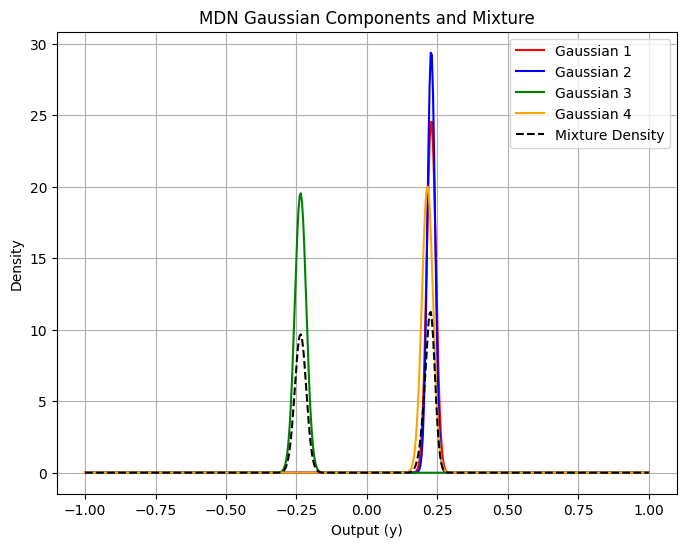

In [170]:

# Define Gaussian PDF
def gaussian_pdf(y, mu, sigma):
    return (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * ((y - mu) / sigma) ** 2)

# Generate grid for plotting
x_range = np.linspace(-1, 1, 100)  # Input range
y_range = np.linspace(-1, 1, 500) # Output range
grid_x, grid_y = np.meshgrid(x_range, y_range)

grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

# Pass input through MDN to get parameters
num_query_points = 1
query_points = np.linspace(-0.2, 1, num_query_points)
query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
z = torch.randn(num_query_points, latent_size).to(device)

log_pi, mu, sigma = ebgan_mdn_generator.forward(z, query_points_tensor)
log_pi = log_pi.detach().cpu().numpy()  # Shape: (num_points, num_gaussians)
mu = mu.detach().cpu().numpy()          # Shape: (num_points, num_gaussians, output_dim)
sigma = sigma.detach().cpu().numpy()    # Shape: (num_points, num_gaussians, output_dim)

plt.figure(figsize=(8, 6))
colors = ['red', 'blue', 'green', 'orange', 'purple']  # Add more colors if needed
for i in range(len(mu[0])):  # Iterate over the number of Gaussians
    pdf = gaussian_pdf(y_range, mu[0][i][0], sigma[0][i][0])  # Compute PDF for the i-th Gaussian
    plt.plot(y_range, pdf, color=colors[i % len(colors)], label=f'Gaussian {i+1}')

# Plot the mixture density (sum of all Gaussians)
mixture_density = sum(np.exp(log_pi[0][i]) * gaussian_pdf(y_range, mu[0][i][0], sigma[0][i][0]) for i in range(len(mu[0])))
plt.plot(y_range, mixture_density, color='black', linestyle='--', label='Mixture Density')

# Add labels and legend
plt.xlabel('Output (y)')
plt.ylabel('Density')
plt.title(f'MDN Gaussian Components and Mixture')
plt.legend()
plt.grid()
plt.show()

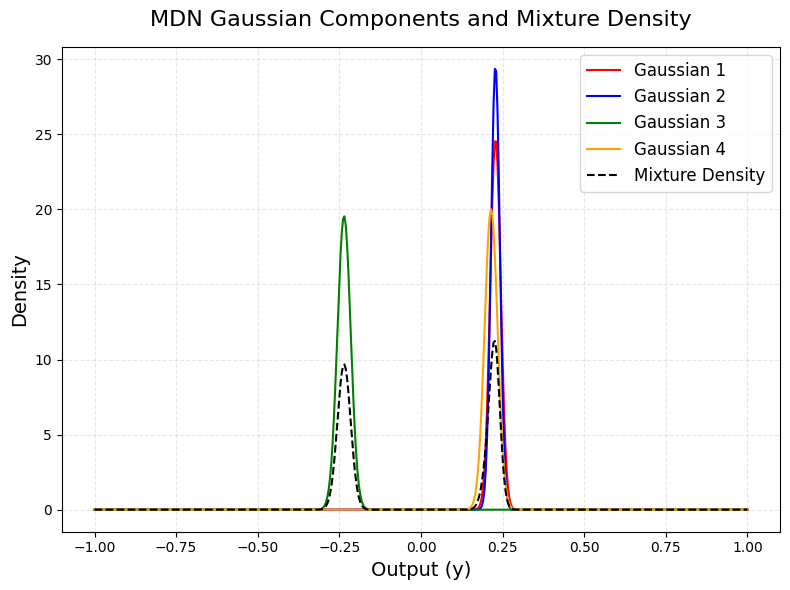

<Figure size 640x480 with 0 Axes>

In [171]:
# Define Gaussian PDF
def gaussian_pdf(y, mu, sigma):
    """Compute the Gaussian PDF."""
    return (1 / (np.sqrt(2 * np.pi) * sigma)) * np.exp(-0.5 * ((y - mu) / sigma) ** 2)


# Generate grid for plotting
x_range = np.linspace(-1, 1, 100)  # Input range
y_range = np.linspace(-1, 1, 500) # Output range
grid_x, grid_y = np.meshgrid(x_range, y_range)

grid_points = torch.tensor(np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32).to(device)

# Pass input through MDN to get parameters
num_query_points = 1
query_points = np.linspace(-0.2, 1, num_query_points)
query_points_tensor = torch.tensor(query_points, dtype=torch.float32).unsqueeze(1).to(device)
z = torch.randn(num_query_points, latent_size).to(device)

log_pi, mu, sigma = ebgan_mdn_generator.forward(z, query_points_tensor)
log_pi = log_pi.detach().cpu().numpy()  # Shape: (num_points, num_gaussians)
mu = mu.detach().cpu().numpy()          # Shape: (num_points, num_gaussians, output_dim)
sigma = sigma.detach().cpu().numpy()    # Shape: (num_points, num_gaussians, output_dim)

plt.figure(figsize=(8, 6))
colors = ['red', 'blue', 'green', 'orange', 'purple']  # Add more colors if needed
for i in range(len(mu[0])):  # Iterate over the number of Gaussians
    pdf = gaussian_pdf(y_range, mu[0][i][0], sigma[0][i][0])  # Compute PDF for the i-th Gaussian
    plt.plot(y_range, pdf, color=colors[i % len(colors)], label=f'Gaussian {i+1}')

# Plot the mixture density (sum of all Gaussians)
mixture_density = sum(np.exp(log_pi[0][i]) * gaussian_pdf(y_range, mu[0][i][0], sigma[0][i][0]) for i in range(len(mu[0])))
plt.plot(y_range, mixture_density, color='black', linestyle='--', label='Mixture Density')


# Customize the plot for paper aesthetics
plt.xlabel('Output (y)', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('MDN Gaussian Components and Mixture Density', fontsize=16, pad=15)
plt.legend(fontsize=12, loc='upper right')
plt.grid(alpha=0.3, linestyle='--')
plt.tight_layout()
plt.show()
plt.savefig('mdn_gaussian_components.png')  # Save as PNG



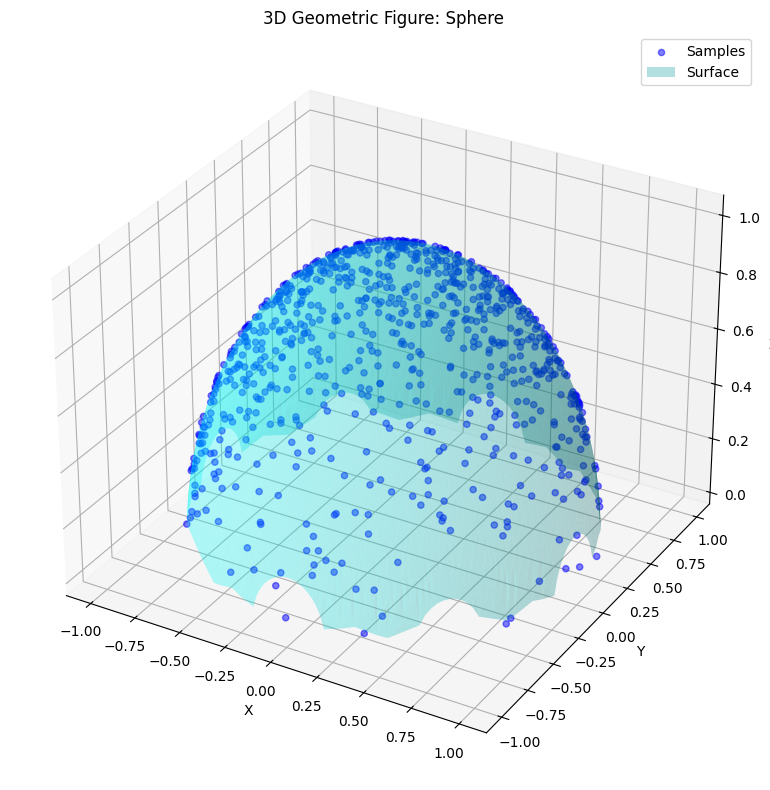

In [172]:
import numpy as np
import torch
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Define multi-valued 3D functions
def z_sphere(x, y, r=1):
    z1 = np.sqrt(r**2 - x**2 - y**2)
    z2 = -np.sqrt(r**2 - x**2 - y**2)
    return z1, z2

def z_helix(x, y, a=1, b=0.5):
    z = a * np.sin(b * np.sqrt(x**2 + y**2))
    return z,

def z_paraboloid(x, y, a=1):
    z = a * (x**2 + y**2)
    return z,

z_multi = z_sphere  # Choose the function to generate samples

# Create a dataset of (x, y, z) pairs
num_samples = 1000
x = np.random.uniform(-1, 1, num_samples)
y = np.random.uniform(-1, 1, num_samples)
valid_mask = x**2 + y**2 <= 1  # Ensure points are within the sphere's radius
x, y = x[valid_mask], y[valid_mask]  # Filter valid samples
z_vals = [z_multi(x_i, y_i) for x_i, y_i in zip(x, y)]
z_vals_transposed = list(zip(*z_vals))

# Create tensor dataset
x_tensor = torch.tensor(x, dtype=torch.float32).unsqueeze(1)
y_tensor = torch.tensor(y, dtype=torch.float32).unsqueeze(1)
z_tensor = torch.tensor(z_vals_transposed[0], dtype=torch.float32).unsqueeze(1)  # Use first z branch
dataset = TensorDataset(x_tensor, y_tensor, z_tensor)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

# Data bounds for counter-sample generation
z_min = torch.tensor([-1])
z_max = torch.tensor([1])

# Plot the geometric figure and samples
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Generate grid for visualization
x_vals = np.linspace(-1, 1, 100)
y_vals = np.linspace(-1, 1, 100)
X, Y = np.meshgrid(x_vals, y_vals)
valid_mask = X**2 + Y**2 <= 1  # Only plot valid points within the sphere radius
X, Y = X[valid_mask], Y[valid_mask]
Z_vals = [z_multi(X[i], Y[i]) for i in range(len(X))]
Z = np.array([z[0] for z in Z_vals])

# Plot the figure
ax.scatter(x, y, z_vals_transposed[0], color='blue', alpha=0.5, label='Samples')  # Plot the sampled points
ax.plot_trisurf(X, Y, Z, color='cyan', alpha=0.3, label='Surface')

# Labels and legend
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Geometric Figure: Sphere')
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [173]:
from mpl_toolkits.mplot3d import Axes3D

def evaluate_model_3d(energy_model, generator, epoch, latent_size, device):
    # Generate grid points within the range of x, y, and z values
    x_range = np.linspace(-1, 1, 30)
    y_range = np.linspace(-1, 1, 30)
    z_range = np.linspace(-1, 1, 30)
    grid_x, grid_y, grid_z = np.meshgrid(x_range, y_range, z_range)

    # Concatenate x and y for input to the energy model
    grid_points = torch.tensor(
        np.stack([grid_x.ravel(), grid_y.ravel()], axis=1), dtype=torch.float32
    ).to(device)
    
    # Fake action/target z-values for energy computation
    z_fake = torch.tensor(grid_z.ravel(), dtype=torch.float32).unsqueeze(1).to(device)

    # Compute energy model output for each grid point
    energy_outputs = energy_model(grid_points, z_fake).detach().cpu().numpy()
    energy_outputs = energy_outputs.reshape(grid_x.shape)

    # Generate random query points
    num_query_points = 200
    query_points_x = np.random.uniform(-1, 1, num_query_points)
    query_points_y = np.random.uniform(-1, 1, num_query_points)
    query_points = torch.tensor(np.stack([query_points_x, query_points_y], axis=1), dtype=torch.float32).to(device)

    z = torch.randn(num_query_points, latent_size).to(device)
    predictions_mdn = generator.sample(z, query_points).detach().cpu().numpy()

    # 3D Scatter Plot
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the samples
    ax.scatter(query_points_x, query_points_y, predictions_mdn, c='blue', alpha=0.6, label='MDN Predictions')

    # Plot the energy surface
    ax.plot_surface(grid_x, grid_y, energy_outputs, cmap='coolwarm', alpha=0.7)

    # Labels and Title
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Energy Output')
    plt.title(f"Evaluation at Epoch {epoch}")
    ax.legend()
    plt.show()



In [174]:
from mpl_toolkits.mplot3d import Axes3D

def evaluate_model_3d(energy_model, generator, epoch, latent_size, device):
    # Generate grid points within the range of x and y values
    x_range = np.linspace(-1, 1, 30)
    y_range = np.linspace(-1, 1, 30)
    z_value = 0.0  # Fixed Z value for slicing the energy surface

    grid_x, grid_y = np.meshgrid(x_range, y_range)
    grid_points = torch.tensor(
        np.stack([grid_x.ravel(), grid_y.ravel(), np.full(grid_x.size, z_value)], axis=1),
        dtype=torch.float32,
    ).to(device)

    # Compute energy model output for each grid point
    z_fake = torch.zeros((grid_points.size(0), 1)).to(device)
    energy_outputs = energy_model(grid_points[:, :2], z_fake).detach().cpu().numpy()
    energy_outputs = energy_outputs.reshape(grid_x.shape)  # Reshape for 2D plotting

    # Randomly sample query points and get predictions from the generator
    num_query_points = 200
    query_points_x = np.random.uniform(-1, 1, num_query_points)
    query_points_y = np.random.uniform(-1, 1, num_query_points)
    query_points = torch.tensor(
        np.stack([query_points_x, query_points_y], axis=1), dtype=torch.float32
    ).to(device)

    z = torch.randn(num_query_points, latent_size).to(device)
    predictions_mdn = generator.sample(z, query_points).detach().cpu().numpy()

    # 3D Scatter Plot
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Plot the samples
    ax.scatter(query_points_x, query_points_y, predictions_mdn, c='blue', alpha=0.6, label='MDN Predictions')

    # Plot the energy surface
    # ax.plot_surface(grid_x, grid_y, energy_outputs, cmap='coolwarm', alpha=0.7)

    # Labels and Title
    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.set_zlim(-1, 1)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Energy Output')
    plt.title(f"Evaluation at Epoch {epoch}")
    ax.legend()
    plt.show()


In [145]:
# Define Energy-based Model using MLP
class EnergyModel(nn.Module):
    def __init__(self, input_size, action_size, hidden_size):
        super(EnergyModel, self).__init__()
        self.energy_net = nn.Sequential(
            nn.Linear(input_size + action_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, 1)
        )

    def forward(self, x, y):
        combined = torch.cat([x, y], dim=-1)
        return self.energy_net(combined).squeeze(-1)

# Define MDN Generator
class MDNGenerator(nn.Module):
    def __init__(self, input_size, hidden_size, output_size, num_gaussians, condition_size, noise_type=NoiseType.ISOTROPIC, fixed_noise_level=None):
        super(MDNGenerator, self).__init__()
        assert (fixed_noise_level is not None) == (noise_type is NoiseType.FIXED)
        self.latent_size = input_size
        self.num_gaussians = num_gaussians
        self.noise_type = noise_type
        self.fixed_noise_level = fixed_noise_level
        num_sigma_channels = {
            NoiseType.DIAGONAL: output_size * num_gaussians,
            NoiseType.ISOTROPIC: num_gaussians,
            NoiseType.ISOTROPIC_ACROSS_CLUSTERS: 1,
            NoiseType.FIXED: 0,
        }[noise_type]
        self.hidden = nn.Sequential(
            nn.Linear(input_size + condition_size, hidden_size),
            nn.ReLU(),
            nn.Linear(hidden_size, hidden_size),
            nn.ReLU()
        )
        self.pi = nn.Linear(hidden_size, num_gaussians)
        self.normal_network = nn.Linear(hidden_size, output_size * num_gaussians + num_sigma_channels)

    def forward(self, x, condition, eps=1e-6):
        x = torch.cat([x, condition], dim=1)
        hidden = self.hidden(x)
        log_pi = torch.log_softmax(self.pi(hidden), dim=1)
        normal_params = self.normal_network(hidden)
        mu = normal_params[..., :self.num_gaussians * output_size]
        sigma = normal_params[..., self.num_gaussians * output_size:]
        if self.noise_type is NoiseType.DIAGONAL:
            sigma = torch.exp(sigma + eps)
        if self.noise_type is NoiseType.ISOTROPIC:
            sigma = torch.exp(sigma + eps).repeat(1, output_size)
        if self.noise_type is NoiseType.ISOTROPIC_ACROSS_CLUSTERS:
            sigma = torch.exp(sigma + eps).repeat(1, self.num_gaussians * output_size)
        if self.noise_type is NoiseType.FIXED:
            sigma = torch.full_like(mu, fill_value=self.fixed_noise_level)
        mu = mu.view(-1, self.num_gaussians, output_size)
        sigma = sigma.view(-1, self.num_gaussians, output_size)
        return log_pi, mu, sigma
    
    def sample(self, x, condition):
        log_pi, mu, sigma = self.forward(x, condition)
        cum_pi = torch.cumsum(torch.exp(log_pi), dim=-1)
        rvs = torch.rand(len(x), 1).to(x.device)
        rand_pi = torch.searchsorted(cum_pi, rvs)
        rand_normal = torch.randn_like(mu) * sigma + mu
        samples = torch.gather(rand_normal, 1, rand_pi.unsqueeze(-1).expand(-1, -1, mu.size(-1))).squeeze(1)
        return samples
    
    # def sample(self, z, condition):
    #     # Concatenate latent vector z and condition
    #     input_combined = torch.cat([z, condition], dim=1)  # Ensure sizes match
    #     log_pi, mu, sigma = self.forward(input_combined, condition)
    #     cum_pi = torch.cumsum(torch.exp(log_pi), dim=-1)
    #     rvs = torch.rand(len(z), 1).to(z.device)
    #     rand_pi = torch.searchsorted(cum_pi, rvs)
    #     rand_normal = torch.randn_like(mu) * sigma + mu
    #     samples = torch.gather(rand_normal, 1, rand_pi.unsqueeze(-1).expand(-1, -1, mu.size(-1))).squeeze(1)
    #     return samples


def mdn_loss(log_pi, mu, sigma, y):
    z_score = (y.unsqueeze(1) - mu) / sigma
    normal_loglik = (
        -0.5 * torch.einsum("bij,bij->bi", z_score, z_score)
        - torch.sum(torch.log(sigma), dim=-1)
    )
    loglik = torch.logsumexp(log_pi + normal_loglik, dim=-1)
    return -loglik.mean()

# InfoNCE-style loss function
def info_nce_loss(energy_model, x, y, counter_samples):
    positive_energy = -energy_model(x, y)
    neg_energies = torch.stack([-energy_model(x, neg) for neg in counter_samples], dim=1)
    denominator = torch.logsumexp(torch.cat([positive_energy.unsqueeze(-1), neg_energies], dim=-1), dim=-1)
    return torch.mean(denominator - positive_energy)

# Counter-sample generation
def generate_counter_samples(y_min, y_max, batch_size, neg_count, device):
    counter_samples = [torch.rand((batch_size, y_min.size(-1)), device=device) * (y_max - y_min) + y_min for _ in range(neg_count)]
    return counter_samples

# Training loop combining energy model with MDN generator
def train_ebgan_mdn(energy_model, generator, dataloader, criterion, optimizer_e, optimizer_g, num_epochs, y_min, y_max, neg_count, device):
    energy_model.train()
    generator.train()
    # Initialize lists to track losses
    energy_losses = []
    generator_losses = []
    mdn_losses = []
    total_losses = []
    for epoch in range(num_epochs):
        epoch_energy_loss = 0.0
        epoch_generator_loss = 0.0
        epoch_mdn_loss = 0.0

        for batch_x, batch_y, batch_z in dataloader:  # Updated to unpack three tensors
            x_input = batch_x.to(device)
            y_input = batch_y.to(device)
            z_target = batch_z.to(device)

            for _ in range(repeat_energy_updates):
                # Generate noise samples
                z = torch.randn(x_input.size(0), generator.latent_size).to(device)

                # Generate fake samples
                fake_z_target = generator.sample(z, torch.cat([x_input, y_input], dim=1))

                counter_samples = generate_counter_samples(y_min, y_max, x_input.size(0), neg_count, device)
                counter_samples.append(fake_z_target)

                # Compute energy loss
                energy_loss = criterion(energy_model, torch.cat([x_input, y_input], dim=1), z_target, counter_samples)

                # Backpropagation for energy model
                optimizer_e.zero_grad()
                energy_loss.backward()
                optimizer_e.step()

                epoch_energy_loss += energy_loss.item()

            # Update generator
            z = torch.randn(x_input.size(0), generator.latent_size).to(device)
            fake_z_target = generator.sample(z, torch.cat([x_input, y_input], dim=1))
            generator_energy_loss = energy_model(torch.cat([x_input, y_input], dim=1), fake_z_target).mean()

            # Compute MDN loss
            log_pi, mu, sigma = generator(z, torch.cat([x_input, y_input], dim=1))
            mdn_loss_value = mdn_loss(log_pi, mu, sigma, z_target)

            # Combined generator loss
            generator_loss = generator_energy_loss + mdn_loss_value

            # Backpropagation for generator
            optimizer_g.zero_grad()
            generator_loss.backward()
            optimizer_g.step()

            epoch_generator_loss += generator_energy_loss.item()
            epoch_mdn_loss += mdn_loss_value.item()

        # Average losses per epoch
        avg_energy_loss = epoch_energy_loss / len(dataloader) / repeat_energy_updates
        avg_generator_loss = epoch_generator_loss / len(dataloader)
        avg_mdn_loss = epoch_mdn_loss / len(dataloader)

        print(f"Epoch [{epoch+1}/{num_epochs}], Energy Loss: {avg_energy_loss:.4f}, Generator Loss: {avg_generator_loss:.4f}, MDN Loss: {avg_mdn_loss:.4f}")

        # Evaluate model every 20 epochs
        if (epoch + 1) % 5 == 0:
            evaluate_model_3d(energy_model, generator, epoch + 1, generator.latent_size, device)
        
    # Plot the loss curves
    plt.figure(figsize=(10, 6))
    plt.plot(range(1, num_epochs + 1), energy_losses, label='Energy Model Loss')
    plt.plot(range(1, num_epochs + 1), generator_losses, label='Generator Energy Loss')
    plt.plot(range(1, num_epochs + 1), mdn_losses, label='MDN Loss')
    plt.plot(range(1, num_epochs + 1), total_losses, label='Total Generator Loss', linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Loss Curves for EBGAN-MDN Training')
    plt.legend()
    plt.grid(True)
    plt.show()

Epoch [1/100], Energy Loss: 3.2831, Generator Loss: -0.1987, MDN Loss: -0.1822
Epoch [2/100], Energy Loss: 2.4110, Generator Loss: -0.7412, MDN Loss: -0.9922
Epoch [3/100], Energy Loss: 1.6568, Generator Loss: -1.9288, MDN Loss: -1.5135
Epoch [4/100], Energy Loss: 1.2385, Generator Loss: -2.0468, MDN Loss: -1.5462
Epoch [5/100], Energy Loss: 1.0228, Generator Loss: -2.1555, MDN Loss: -1.6602


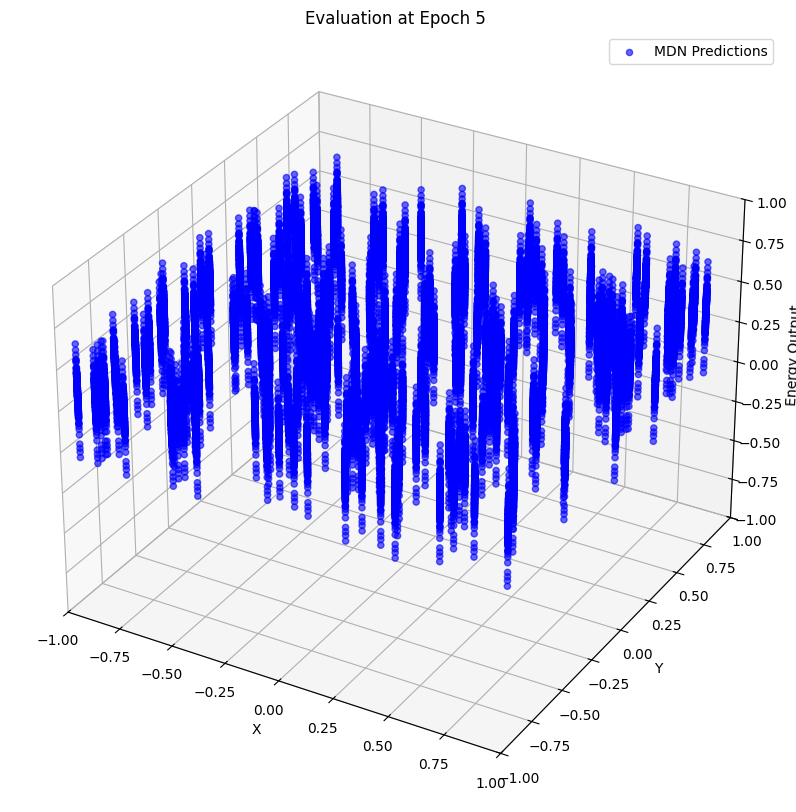

Epoch [6/100], Energy Loss: 0.8614, Generator Loss: -1.7841, MDN Loss: -1.6869
Epoch [7/100], Energy Loss: 0.7503, Generator Loss: -1.4607, MDN Loss: -1.7564
Epoch [8/100], Energy Loss: 0.6361, Generator Loss: -0.6104, MDN Loss: -1.8394
Epoch [9/100], Energy Loss: 0.6073, Generator Loss: -0.4344, MDN Loss: -1.6330
Epoch [10/100], Energy Loss: 0.5187, Generator Loss: -0.1013, MDN Loss: -1.8313


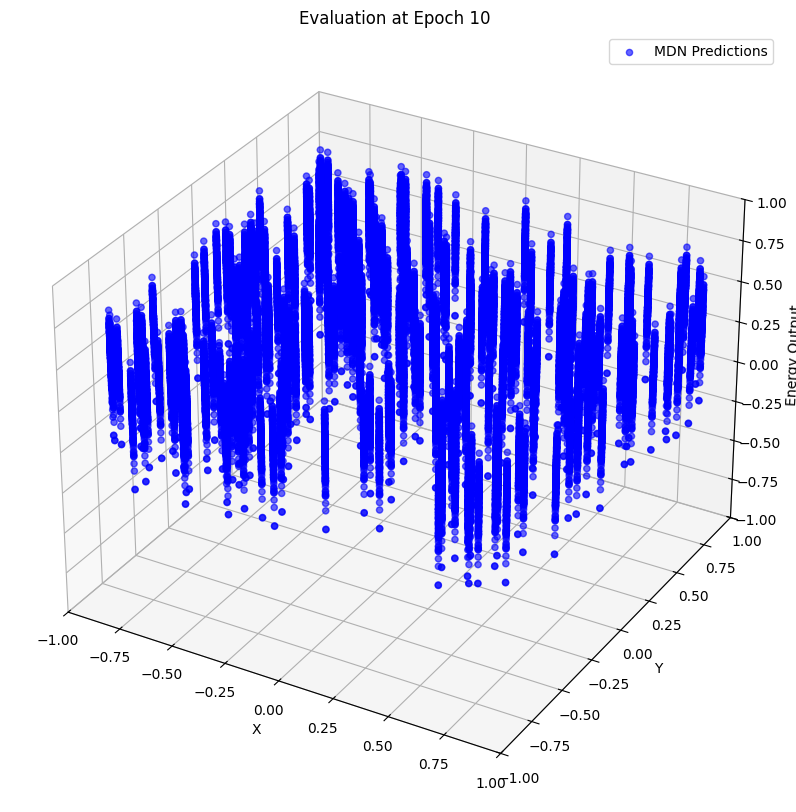

Epoch [11/100], Energy Loss: 0.4764, Generator Loss: 1.6549, MDN Loss: -1.1199
Epoch [12/100], Energy Loss: 0.4462, Generator Loss: 1.8879, MDN Loss: -1.8015
Epoch [13/100], Energy Loss: 0.5354, Generator Loss: 0.0632, MDN Loss: -2.0796
Epoch [14/100], Energy Loss: 0.4957, Generator Loss: 0.8260, MDN Loss: -2.0404
Epoch [15/100], Energy Loss: 0.4157, Generator Loss: 2.3100, MDN Loss: -1.9416


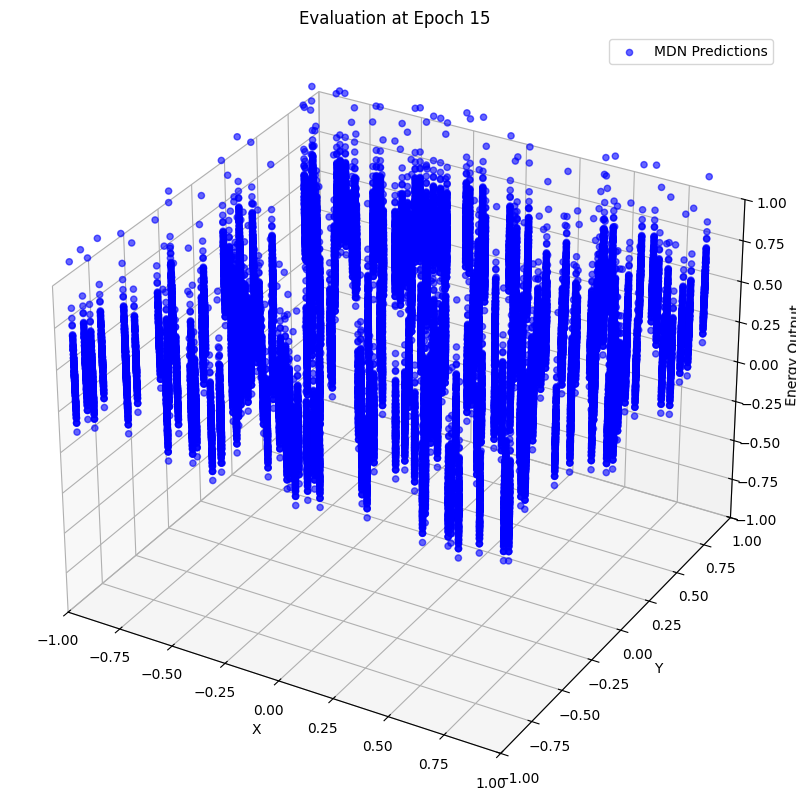

Epoch [16/100], Energy Loss: 0.3800, Generator Loss: 1.7831, MDN Loss: -2.0439
Epoch [17/100], Energy Loss: 0.3942, Generator Loss: 1.1571, MDN Loss: -2.1319
Epoch [18/100], Energy Loss: 0.4913, Generator Loss: -0.1318, MDN Loss: -2.4537
Epoch [19/100], Energy Loss: 0.4342, Generator Loss: 0.1912, MDN Loss: -2.5217
Epoch [20/100], Energy Loss: 0.3627, Generator Loss: 6.1764, MDN Loss: -1.7371


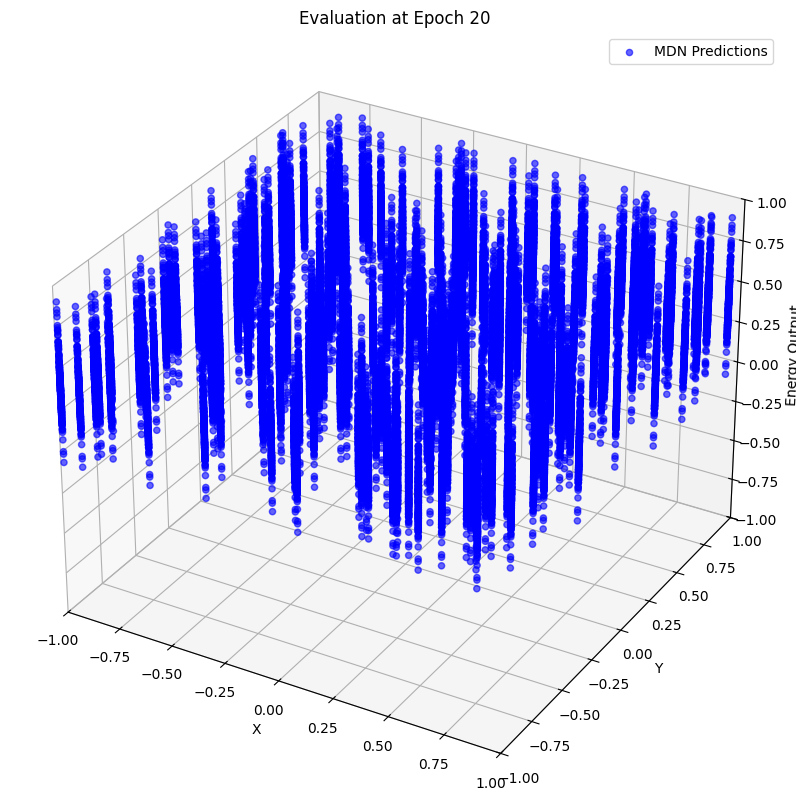

Epoch [21/100], Energy Loss: 0.3896, Generator Loss: 4.8343, MDN Loss: -2.0474
Epoch [22/100], Energy Loss: 0.3963, Generator Loss: 2.5525, MDN Loss: -2.2350
Epoch [23/100], Energy Loss: 0.3979, Generator Loss: 2.2795, MDN Loss: -2.0430
Epoch [24/100], Energy Loss: 0.3337, Generator Loss: 3.0604, MDN Loss: -2.2669
Epoch [25/100], Energy Loss: 0.3376, Generator Loss: 4.4766, MDN Loss: -2.2169


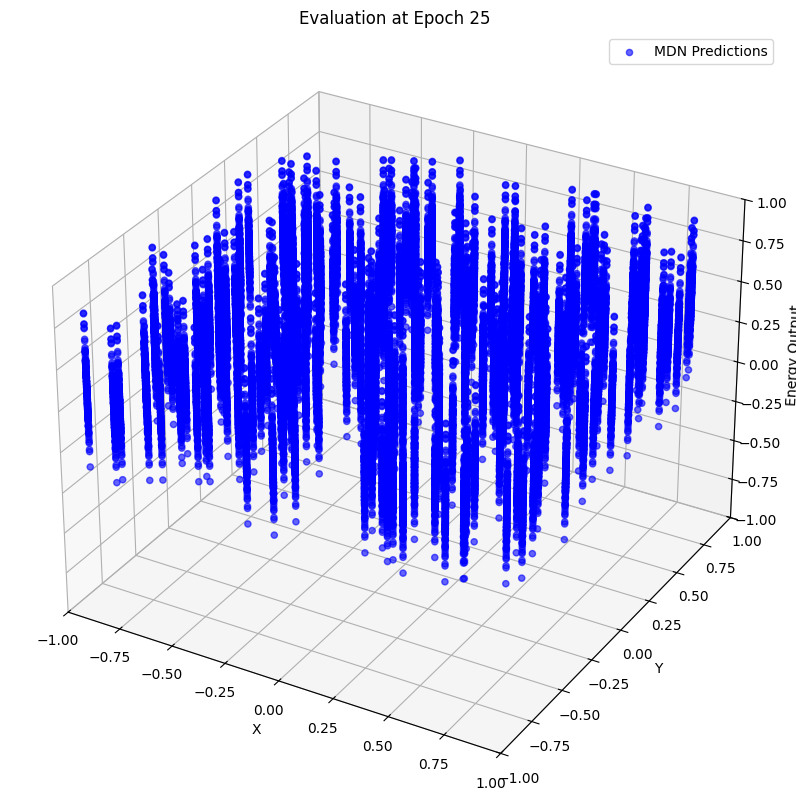

Epoch [26/100], Energy Loss: 0.3983, Generator Loss: 4.9781, MDN Loss: -2.1140
Epoch [27/100], Energy Loss: 0.3697, Generator Loss: 3.0952, MDN Loss: -2.5005
Epoch [28/100], Energy Loss: 0.3085, Generator Loss: 6.5890, MDN Loss: -2.3791
Epoch [29/100], Energy Loss: 0.3511, Generator Loss: 13.9930, MDN Loss: -1.8694
Epoch [30/100], Energy Loss: 0.3071, Generator Loss: 5.6796, MDN Loss: -2.4876


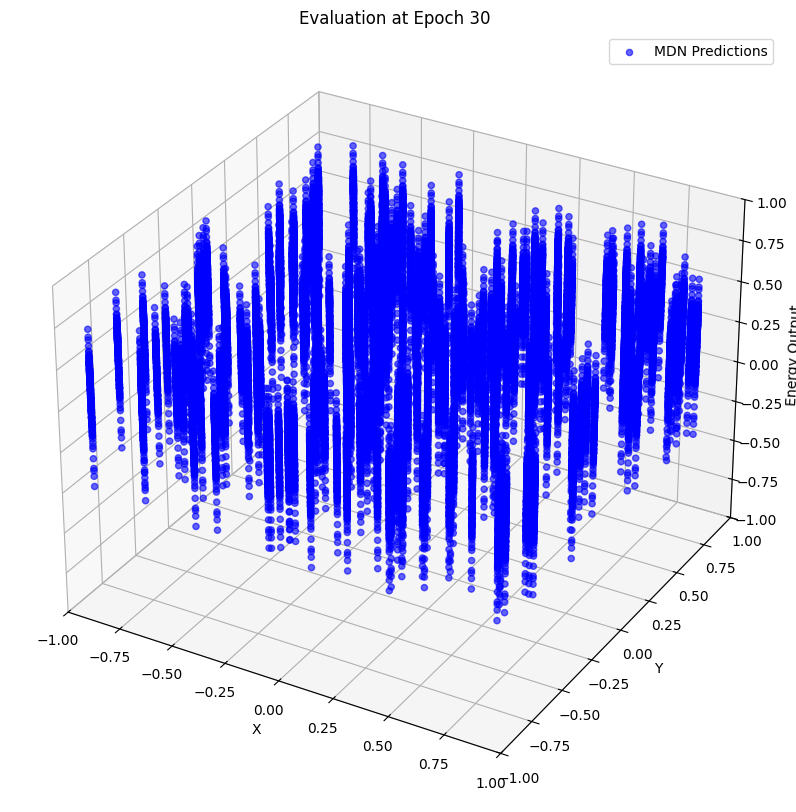

Epoch [31/100], Energy Loss: 0.3701, Generator Loss: 3.4540, MDN Loss: -2.8159
Epoch [32/100], Energy Loss: 0.3330, Generator Loss: 2.6740, MDN Loss: -2.5485
Epoch [33/100], Energy Loss: 0.3135, Generator Loss: 6.3484, MDN Loss: -1.9786
Epoch [34/100], Energy Loss: 0.4927, Generator Loss: 3.3289, MDN Loss: -2.6868
Epoch [35/100], Energy Loss: 0.3735, Generator Loss: 1.7596, MDN Loss: -2.9743


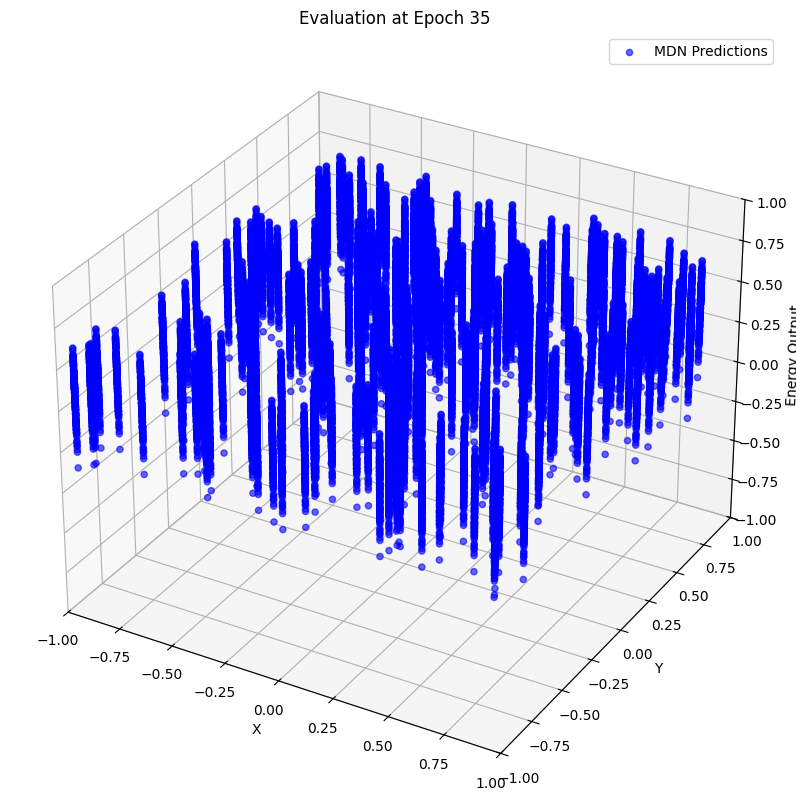

Epoch [36/100], Energy Loss: 0.3120, Generator Loss: 3.2097, MDN Loss: -2.9894
Epoch [37/100], Energy Loss: 0.2500, Generator Loss: 3.2887, MDN Loss: -2.7073
Epoch [38/100], Energy Loss: 0.3344, Generator Loss: 2.4624, MDN Loss: -2.9864
Epoch [39/100], Energy Loss: 0.3337, Generator Loss: 4.3712, MDN Loss: -2.7602
Epoch [40/100], Energy Loss: 0.3367, Generator Loss: 3.1372, MDN Loss: -3.0040


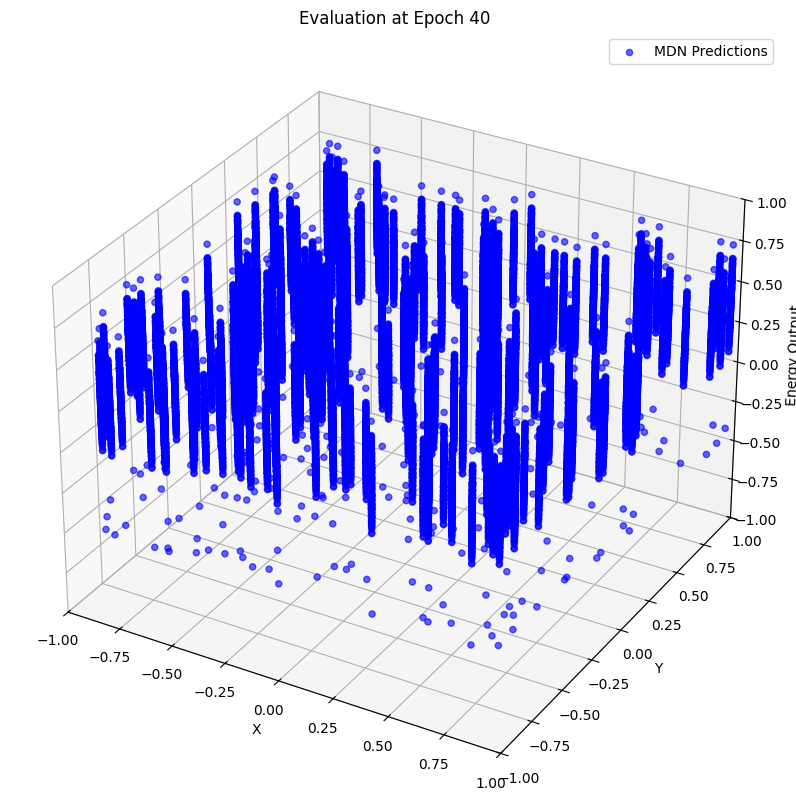

Epoch [41/100], Energy Loss: 0.2860, Generator Loss: 4.5291, MDN Loss: -2.7826
Epoch [42/100], Energy Loss: 0.2417, Generator Loss: 6.8968, MDN Loss: -2.3643
Epoch [43/100], Energy Loss: 0.4767, Generator Loss: 8.7835, MDN Loss: -1.9697
Epoch [44/100], Energy Loss: 0.3904, Generator Loss: 5.5648, MDN Loss: -2.7085
Epoch [45/100], Energy Loss: 0.3331, Generator Loss: 7.2990, MDN Loss: -2.7435


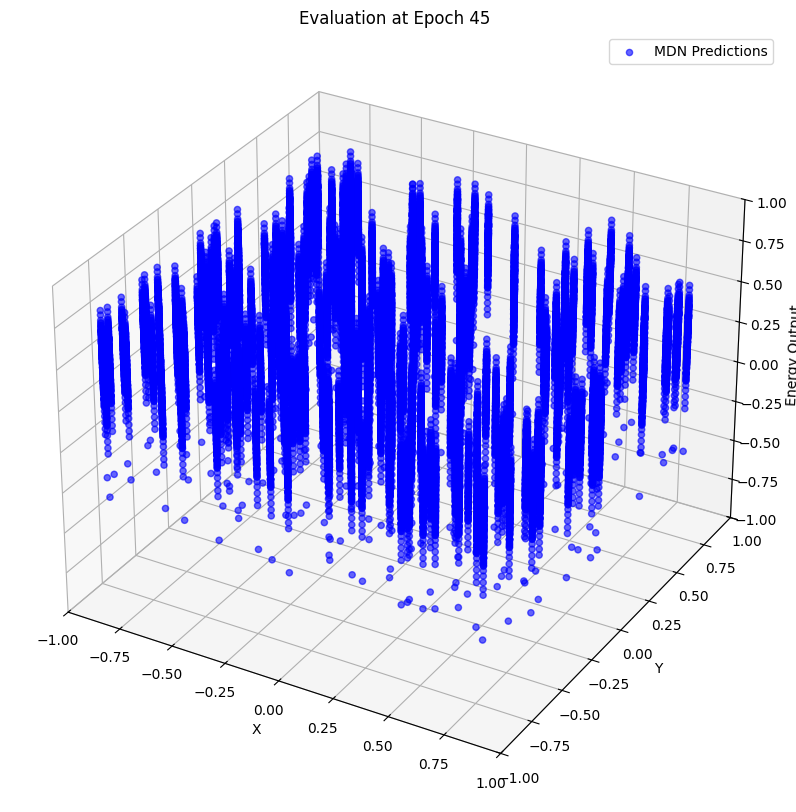

Epoch [46/100], Energy Loss: 0.3137, Generator Loss: 7.3124, MDN Loss: -2.8223
Epoch [47/100], Energy Loss: 0.3376, Generator Loss: 5.1975, MDN Loss: -2.9952
Epoch [48/100], Energy Loss: 0.4128, Generator Loss: 3.4940, MDN Loss: -3.1746
Epoch [49/100], Energy Loss: 0.2866, Generator Loss: 5.2437, MDN Loss: -2.9237
Epoch [50/100], Energy Loss: 0.4797, Generator Loss: 6.3645, MDN Loss: -2.4014


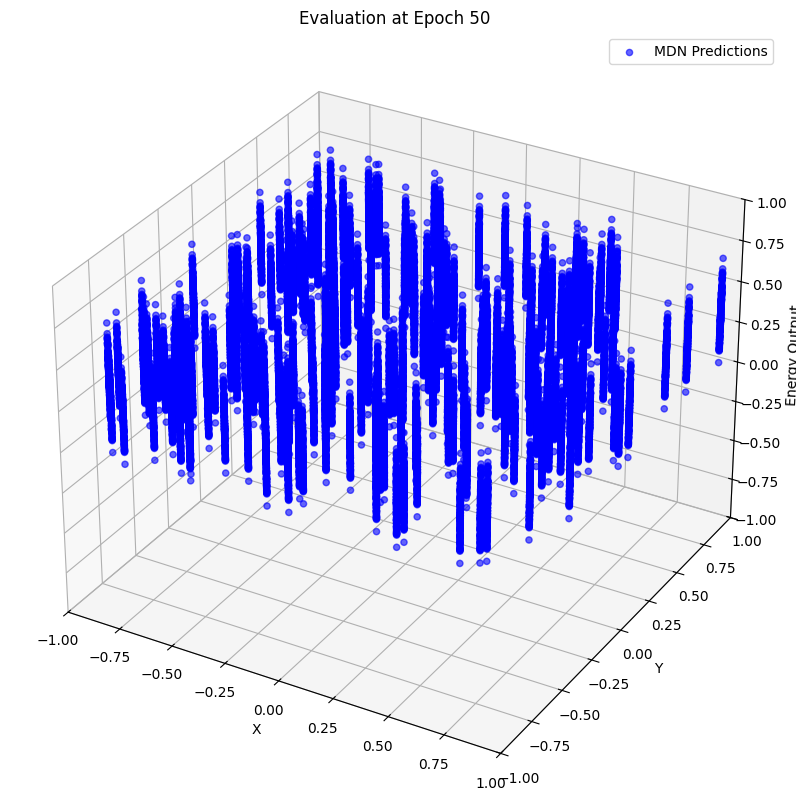

Epoch [51/100], Energy Loss: 0.2968, Generator Loss: 7.0964, MDN Loss: -2.8376
Epoch [52/100], Energy Loss: 0.2674, Generator Loss: 8.7744, MDN Loss: -1.8504
Epoch [53/100], Energy Loss: 0.2321, Generator Loss: 12.6214, MDN Loss: -0.5313
Epoch [54/100], Energy Loss: 0.3177, Generator Loss: 7.8548, MDN Loss: -2.8112
Epoch [55/100], Energy Loss: 0.2806, Generator Loss: 5.2033, MDN Loss: -3.1503


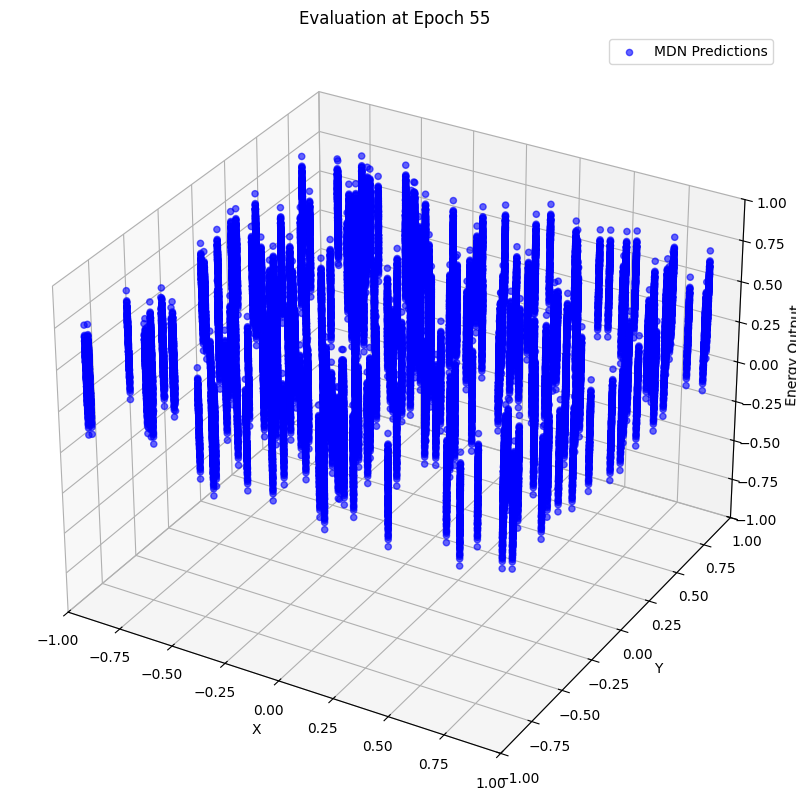

Epoch [56/100], Energy Loss: 0.5132, Generator Loss: 4.3714, MDN Loss: -3.2018
Epoch [57/100], Energy Loss: 0.3454, Generator Loss: 4.7451, MDN Loss: -3.2588
Epoch [58/100], Energy Loss: 0.2293, Generator Loss: 5.8576, MDN Loss: -3.1178
Epoch [59/100], Energy Loss: 0.4651, Generator Loss: 5.4310, MDN Loss: -3.1584
Epoch [60/100], Energy Loss: 0.3729, Generator Loss: 5.0334, MDN Loss: -3.0417


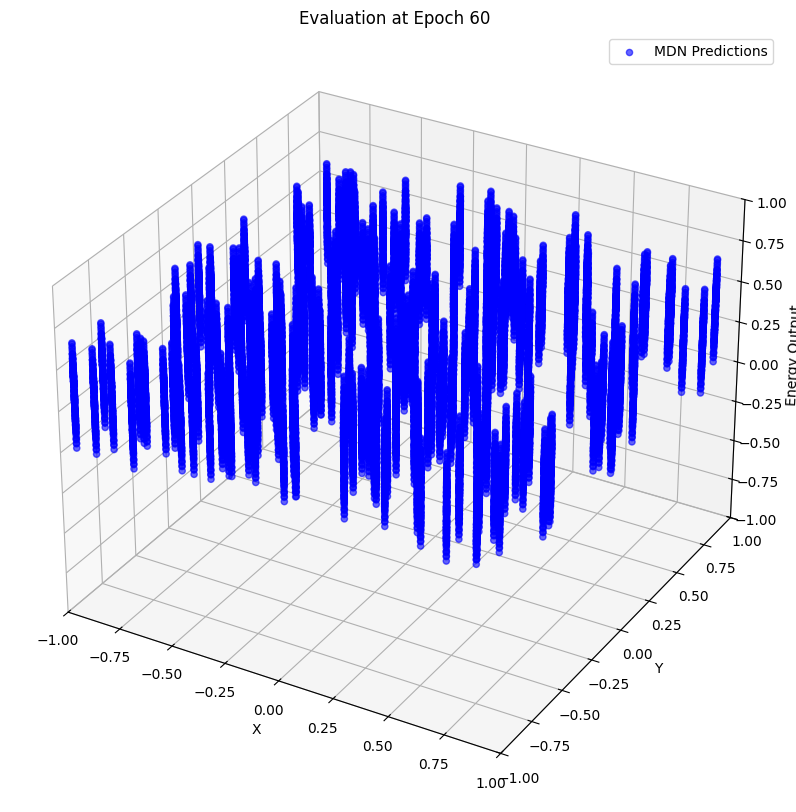

Epoch [61/100], Energy Loss: 0.3046, Generator Loss: 4.3870, MDN Loss: -3.2422
Epoch [62/100], Energy Loss: 0.2953, Generator Loss: 4.0046, MDN Loss: -3.2375
Epoch [63/100], Energy Loss: 0.2757, Generator Loss: 4.6330, MDN Loss: -3.1604
Epoch [64/100], Energy Loss: 0.3618, Generator Loss: 2.8018, MDN Loss: -3.5532
Epoch [65/100], Energy Loss: 0.3753, Generator Loss: 4.4222, MDN Loss: -3.2650


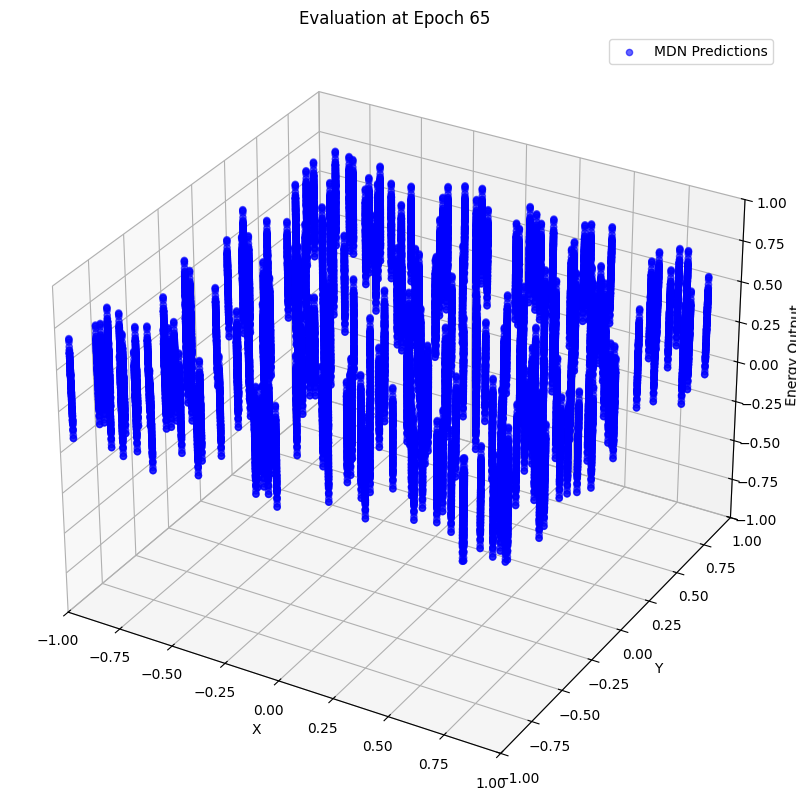

Epoch [66/100], Energy Loss: 0.3814, Generator Loss: 2.4940, MDN Loss: -3.4996
Epoch [67/100], Energy Loss: 0.2472, Generator Loss: 3.1358, MDN Loss: -3.4306
Epoch [68/100], Energy Loss: 0.4505, Generator Loss: 4.0940, MDN Loss: -3.2600
Epoch [69/100], Energy Loss: 0.3663, Generator Loss: 5.5039, MDN Loss: -2.8719
Epoch [70/100], Energy Loss: 0.3266, Generator Loss: 4.1315, MDN Loss: -3.4917


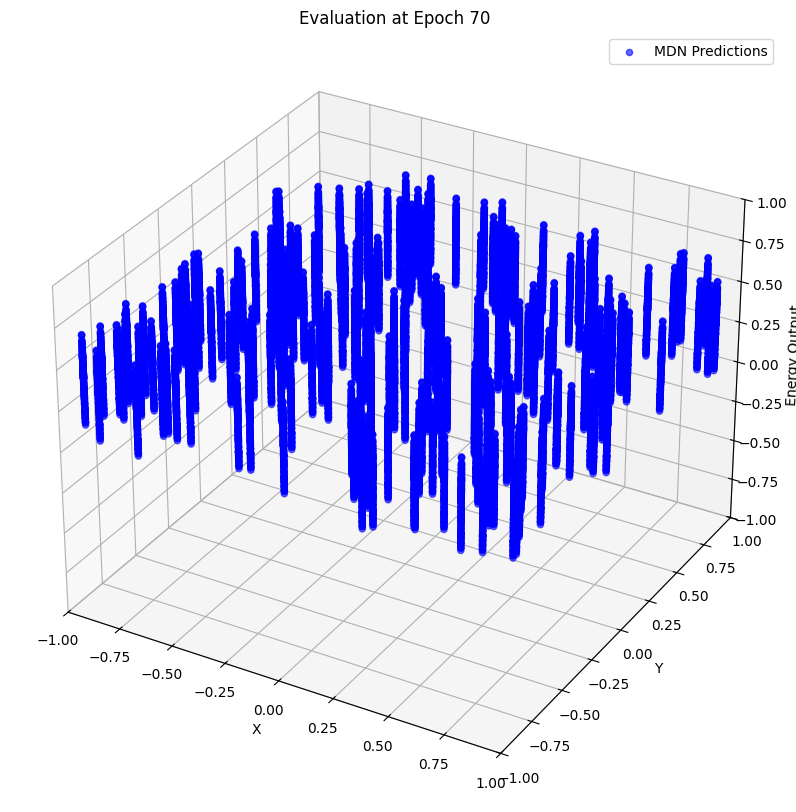

Epoch [71/100], Energy Loss: 0.4242, Generator Loss: 3.3930, MDN Loss: -3.5777
Epoch [72/100], Energy Loss: 0.4187, Generator Loss: 3.8861, MDN Loss: -3.2244
Epoch [73/100], Energy Loss: 0.2744, Generator Loss: 4.5361, MDN Loss: -3.1815
Epoch [74/100], Energy Loss: 0.2710, Generator Loss: 5.1018, MDN Loss: -3.0227
Epoch [75/100], Energy Loss: 0.2802, Generator Loss: 8.4101, MDN Loss: -2.4928


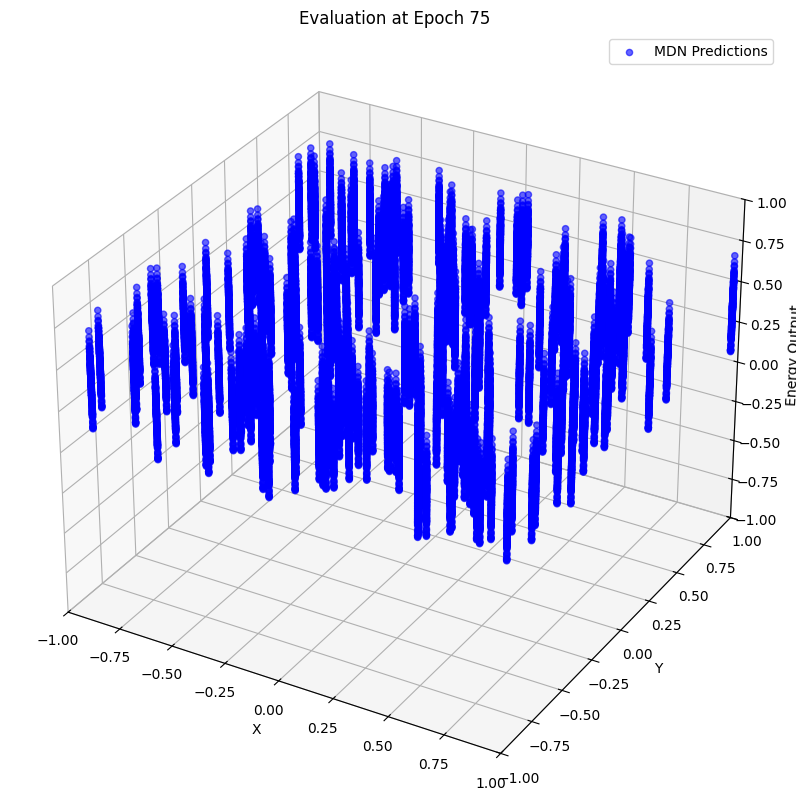

Epoch [76/100], Energy Loss: 0.3678, Generator Loss: 4.7688, MDN Loss: -3.1808
Epoch [77/100], Energy Loss: 0.3827, Generator Loss: 5.3255, MDN Loss: -2.9387
Epoch [78/100], Energy Loss: 0.3251, Generator Loss: 5.0618, MDN Loss: -3.0696
Epoch [79/100], Energy Loss: 0.2666, Generator Loss: 4.5908, MDN Loss: -3.2508
Epoch [80/100], Energy Loss: 0.4496, Generator Loss: 4.9808, MDN Loss: -3.3763


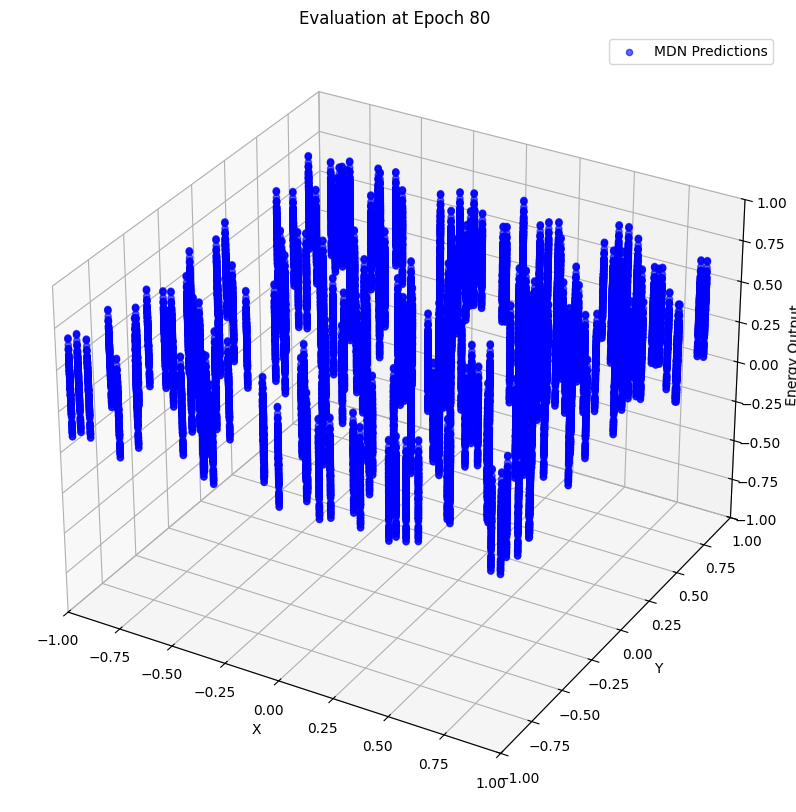

Epoch [81/100], Energy Loss: 0.3375, Generator Loss: 5.7493, MDN Loss: -3.0174
Epoch [82/100], Energy Loss: 0.2630, Generator Loss: 4.3921, MDN Loss: -3.3720
Epoch [83/100], Energy Loss: 0.4127, Generator Loss: 3.8112, MDN Loss: -3.3387
Epoch [84/100], Energy Loss: 0.4294, Generator Loss: 5.2446, MDN Loss: -3.2681
Epoch [85/100], Energy Loss: 0.3723, Generator Loss: 3.0464, MDN Loss: -3.7298


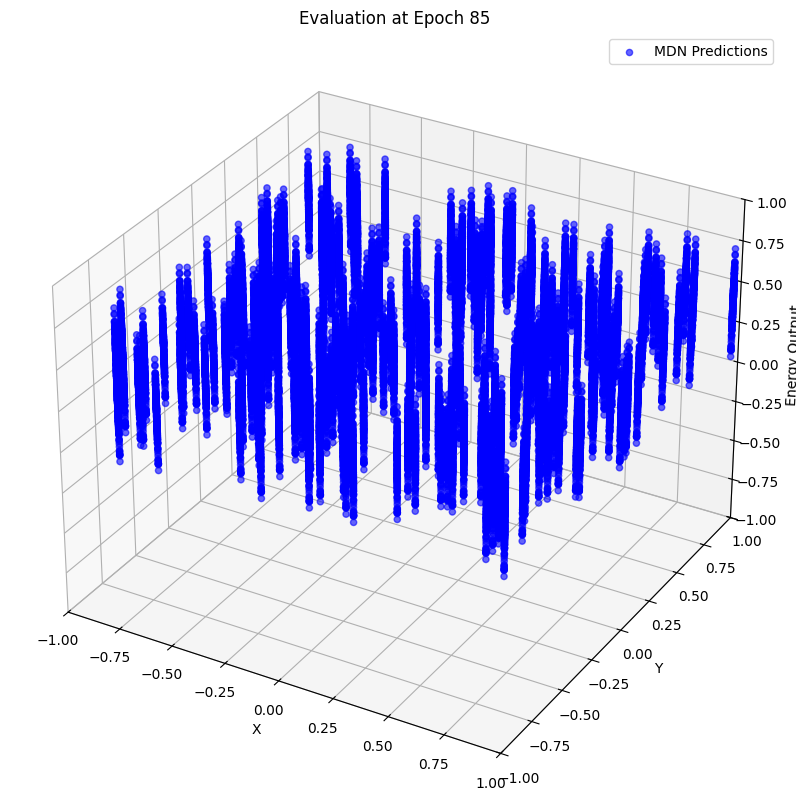

Epoch [86/100], Energy Loss: 0.3465, Generator Loss: 3.8057, MDN Loss: -3.4725
Epoch [87/100], Energy Loss: 0.4123, Generator Loss: 6.8397, MDN Loss: -3.0900
Epoch [88/100], Energy Loss: 0.4218, Generator Loss: 4.9608, MDN Loss: -2.9230
Epoch [89/100], Energy Loss: 0.3880, Generator Loss: 4.1433, MDN Loss: -3.3029
Epoch [90/100], Energy Loss: 0.3561, Generator Loss: 2.5811, MDN Loss: -3.6177


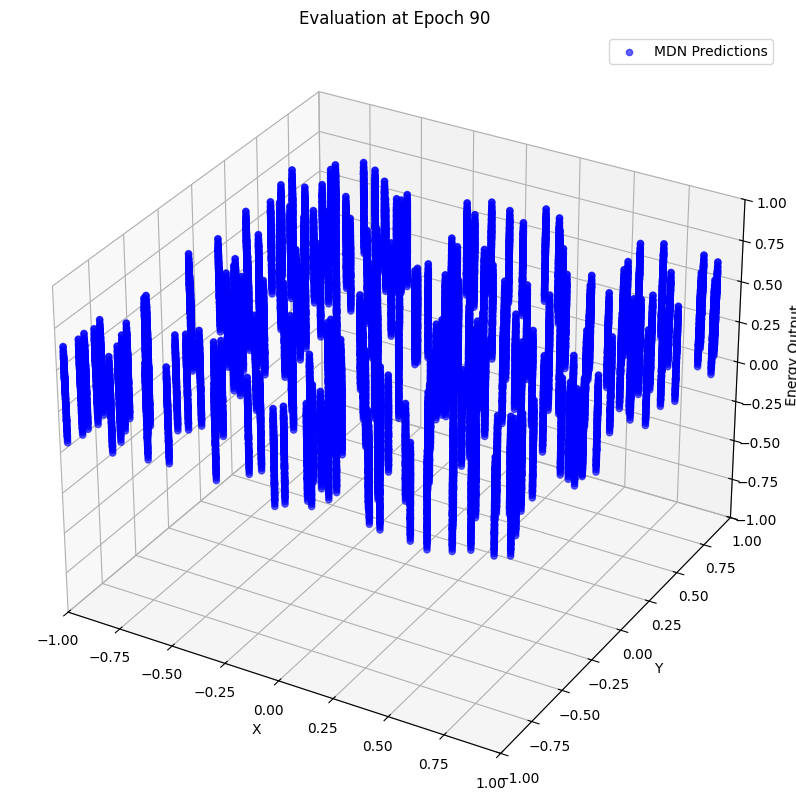

Epoch [91/100], Energy Loss: 0.2853, Generator Loss: 2.7991, MDN Loss: -3.6713
Epoch [92/100], Energy Loss: 0.6216, Generator Loss: 4.1527, MDN Loss: -3.5554
Epoch [93/100], Energy Loss: 0.4570, Generator Loss: 3.7413, MDN Loss: -3.3109
Epoch [94/100], Energy Loss: 0.3930, Generator Loss: 4.0617, MDN Loss: -3.3589
Epoch [95/100], Energy Loss: 0.2832, Generator Loss: 3.1680, MDN Loss: -3.4655


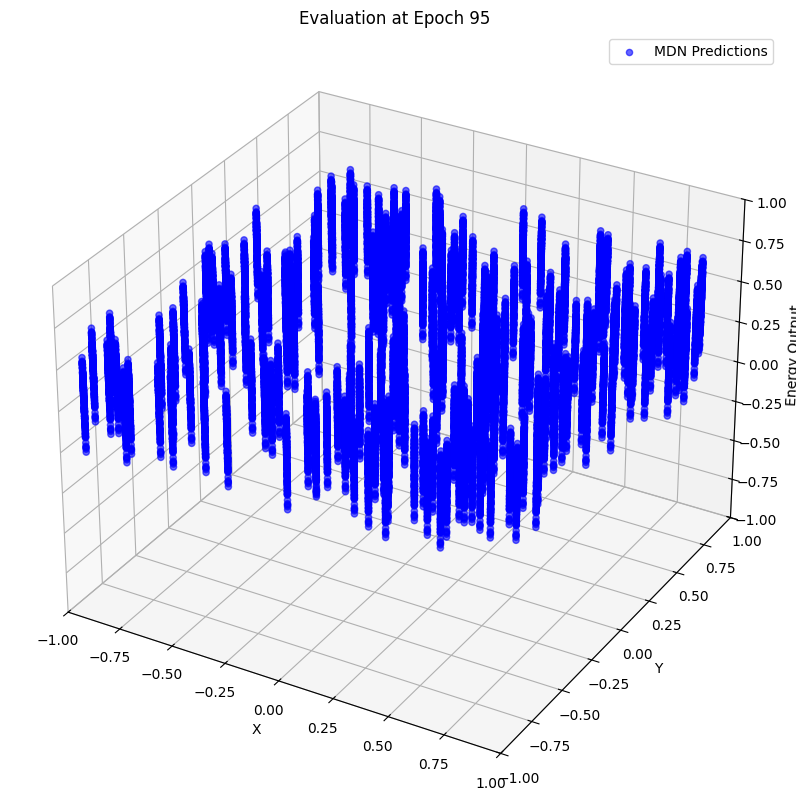

Epoch [96/100], Energy Loss: 0.3220, Generator Loss: 4.1870, MDN Loss: -3.5596
Epoch [97/100], Energy Loss: 0.3142, Generator Loss: 2.6806, MDN Loss: -3.8380
Epoch [98/100], Energy Loss: 0.2898, Generator Loss: 2.3546, MDN Loss: -3.9800
Epoch [99/100], Energy Loss: 0.3432, Generator Loss: 2.6000, MDN Loss: -3.7802
Epoch [100/100], Energy Loss: 0.5050, Generator Loss: 3.1397, MDN Loss: -3.7331


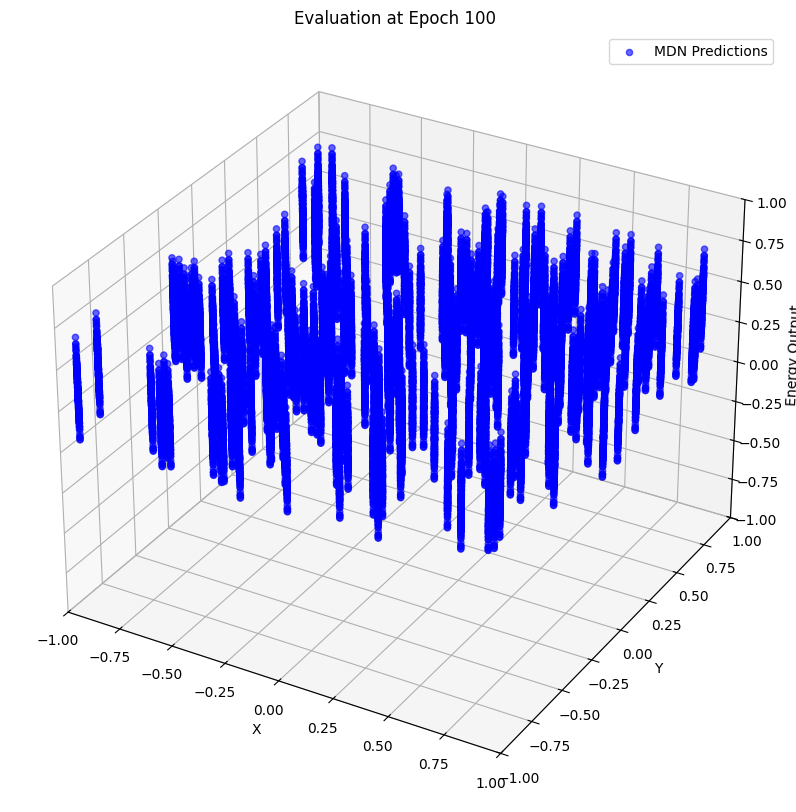

ValueError: x and y must have same first dimension, but have shapes (100,) and (0,)

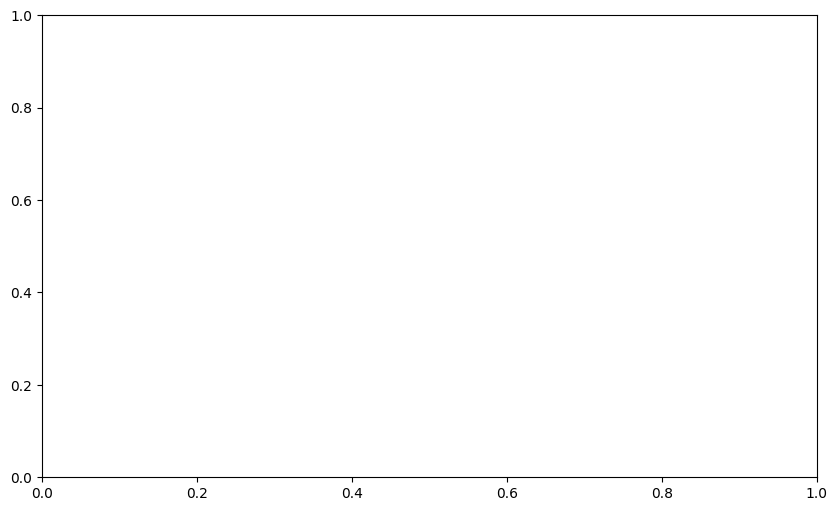

In [148]:
# EBGAN-MDN Parameters for 3D Example
input_size = 2  # For (x, y) inputs
output_size = 1  # For z output
condition_size = 2  # Condition size matches input size (x, y)
hidden_size = 128  # Increased hidden size for 3D complexity
latent_size = 0  # Latent noise size for MDN
num_gaussians = 10  # Number of Gaussian components in the MDN

# Training Parameters
num_epochs = 100
batch_size = 32
neg_count = 32  # Number of counterexamples per batch
repeat_energy_updates = 1  # Energy model updates per epoch
learning_rate_e = 0.001  # Learning rate for the energy model
learning_rate_g = 0.0005  # Learning rate for the generator

# Data Bounds for Counter-Sample Generation
z_min = torch.tensor([-1])  # z lower bound
z_max = torch.tensor([1])  # z upper bound

# Initialize MDN Generator and Energy Model
ebgan_mdn_generator = MDNGenerator(
    input_size=input_size,
    hidden_size=hidden_size,
    output_size=output_size,
    num_gaussians=num_gaussians,
    condition_size=condition_size
).to(device)

ebgan_energy_model = EnergyModel(
    input_size=condition_size,
    action_size=output_size,
    hidden_size=hidden_size
).to(device)

# Optimizers
optimizer_ebgan_e = torch.optim.Adam(ebgan_energy_model.parameters(), lr=learning_rate_e)
optimizer_ebgan_g = torch.optim.Adam(ebgan_mdn_generator.parameters(), lr=learning_rate_g)

# Training Loop
train_ebgan_mdn(
    energy_model=ebgan_energy_model,
    generator=ebgan_mdn_generator,
    dataloader=dataloader,
    criterion=info_nce_loss,
    optimizer_e=optimizer_ebgan_e,
    optimizer_g=optimizer_ebgan_g,
    num_epochs=num_epochs,
    y_min=z_min.to(device),
    y_max=z_max.to(device),
    neg_count=neg_count,
    device=device
)
